# Logistic Regression (Educational Issue 'bout the Future Generation)

In [ ]:
!pip install -q --upgrade pyreadstat

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import missingno as msno
import statsmodels.api as sm

In [ ]:
df = pd.read_spss("data.sav")

## Data Preprocessing

In [ ]:
# Multinomial Logistic Regression on the educational issue of the future generation 
ctrl_vb = ['sex','V238','V239','EDU','V242','V57','V55']
ind_vb = ['V70','V71','V72','V73','V74','V75','V76','V77','V78','V79','V182','V232','V231']
dpd_vb = ['V12','V13','V14','V15','V16','V17','V18','V19','V20','V21','V22']

In [ ]:
df_ctrl_vb = df[ctrl_vb]
transform_dict = {"V238":"soc_class","V239":"income","EDU":"edu","V242":"age",
                  "V242":"age","V57":"marriage_status","V55":"controllability"}
df_ctrl_vb.rename(columns = transform_dict, inplace = True)

for i in df_ctrl_vb.columns:
  df_ctrl_vb[i] = df_ctrl_vb[i].cat.add_categories('Missing')
  df_ctrl_vb.fillna({i:"Missing"}, inplace = True)

df_ctrl_vb["sex"] = df_ctrl_vb["sex"].replace({'女性':'female', '男性':'male'}).astype("category")
df_ctrl_vb["soc_class"] = df_ctrl_vb["soc_class"].replace({'上層階級':1, '中上階級':2, '中下階級':3, '勞工階級':4, '下層階級':5, 'Missing':np.nan}).astype("float")
df_ctrl_vb['income'] = df_ctrl_vb['income'].replace({'最低':'1', '最高':'10', 'Missing':np.nan}).astype("float")
df_ctrl_vb["edu"] = df_ctrl_vb["edu"].replace({'國、初中':2, '大學及以上':5, '專科':4, '小學及以下':1, '高中、職':3, 'Missing':np.nan}).astype("float")
df_ctrl_vb["age"] = df_ctrl_vb["age"].replace({'Missing':np.nan}).astype("float")
df_ctrl_vb["marriage_status"] = df_ctrl_vb["marriage_status"].replace({'分居':'seperated', '同居':'cohabitation', '喪偶':'widowed', '單身（從未結過婚）':'single', '已婚':'married', '離婚':'divorced', 'Missing':np.nan}).astype("category")
df_ctrl_vb['controllability'] = df_ctrl_vb['controllability'].replace({'完全沒選擇權':'1', '有很大的選擇權':'10', 'Missing':np.nan}).astype("float")

In [ ]:
df_ind_vb = df[ind_vb]
transform_dict = {'V70':"Val_Creativity",'V71':'Val_Wealth',
                  'V72':'Val_Security','V73':'Val_Hedonism',
                  'V74':'Val_Altruism','V75':"Val_Achievement",
                  'V76':'Val_Adventure','V77':'Val_Etiquette',
                  'V78':'Val_Green','V79':'Val_Tradition',
                  'V182':'Worry_bout_edu',
                  'V231':'Career_Intellect','V232':'Career_Creativity'}
df_ind_vb.rename(columns = transform_dict, inplace = True)

for i in df_ind_vb.columns:
  df_ind_vb[i] = df_ind_vb[i].cat.add_categories('Missing')
  df_ind_vb.fillna({i:"Missing"}, inplace = True)

df_ind_vb['Val_Creativity'] = df_ind_vb['Val_Creativity'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Wealth'] = df_ind_vb['Val_Wealth'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Security'] = df_ind_vb['Val_Security'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Hedonism'] = df_ind_vb['Val_Hedonism'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Altruism'] = df_ind_vb['Val_Altruism'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Achievement'] = df_ind_vb['Val_Achievement'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Adventure'] = df_ind_vb['Val_Adventure'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Etiquette'] = df_ind_vb['Val_Etiquette'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Green'] = df_ind_vb['Val_Green'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Val_Tradition'] = df_ind_vb['Val_Tradition'].replace({'很像我':6,'像我':5,'有些像我':4,'只有一點像我':3,'不像我':2,'完全不像我':1,'Missing':np.nan}).astype("float")
df_ind_vb['Worry_bout_edu'] = df_ind_vb['Worry_bout_edu'].replace({'一點也不擔心':1,'不太擔心':2,'有點擔心':3,'非常擔心':4,'Missing':np.nan}).astype("float")
df_ind_vb['Career_Intellect'] = df_ind_vb['Career_Intellect'].replace({'完全是靠體力的工作':1,'完全是靠腦力的工作':10,'Missing':np.nan}).astype("float")
df_ind_vb['Career_Creativity'] = df_ind_vb['Career_Creativity'].replace({'完全是例行性的工作':1,'完全是有創造力的工作':10,'Missing':np.nan}).astype("float")

In [ ]:
df_dpd_vb = df[dpd_vb]
transform_dict = {'V12':'Edu_Independence','V13':'Edu_Deligence',
                  'V14':'Edu_Responsibility','V15':'Edu_Imaginativeness',
                  'V16':'Edu_Tolerance&Respect','V17':'Edu_Frugality',
                  'V18':'Edu_Decisiveness','V19':'Edu_Religious_Faithfulness',
                  'V20':'Edu_Altruism','V21':'Edu_Obedience',
                  'V22':'Edu_Self_Expression'}
df_dpd_vb.rename(columns = transform_dict, inplace = True)

for i in df_dpd_vb.columns:
  df_dpd_vb[i] = df_dpd_vb[i].cat.add_categories('Missing')
  df_dpd_vb.fillna({i:"Missing"}, inplace = True)

df_dpd_vb['Edu_Independence'] = df_dpd_vb['Edu_Independence'].replace({'未選擇':0,'選擇':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Deligence'] = df_dpd_vb['Edu_Deligence'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Responsibility'] = df_dpd_vb['Edu_Responsibility'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Imaginativeness'] = df_dpd_vb['Edu_Imaginativeness'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Tolerance&Respect'] = df_dpd_vb['Edu_Tolerance&Respect'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Frugality'] = df_dpd_vb['Edu_Frugality'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Decisiveness'] = df_dpd_vb['Edu_Decisiveness'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Religious_Faithfulness'] = df_dpd_vb['Edu_Religious_Faithfulness'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Altruism'] = df_dpd_vb['Edu_Altruism'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Obedience'] = df_dpd_vb['Edu_Obedience'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')
df_dpd_vb['Edu_Self_Expression'] = df_dpd_vb['Edu_Self_Expression'].replace({'未選擇':0,'重要':1,'Missing':np.nan}).astype('float')

In [ ]:
df_log = pd.concat([df_ctrl_vb,df_ind_vb,df_dpd_vb], axis=1)
df_log

,sex,soc_class,income,edu,age,marriage_status,controllability,Val_Creativity,Val_Wealth,Val_Security,Val_Hedonism,Val_Altruism,Val_Achievement,Val_Adventure,Val_Etiquette,Val_Green,Val_Tradition,Worry_bout_edu,Career_Creativity,Career_Intellect,Edu_Independence,Edu_Deligence,Edu_Responsibility,Edu_Imaginativeness,Edu_Tolerance&Respect,Edu_Frugality,Edu_Decisiveness,Edu_Religious_Faithfulness,Edu_Altruism,Edu_Obedience,Edu_Self_Expression
0,male,3.0,6.0,3.0,28.0,single,7.0,5.0,4.0,4.0,5.0,5.0,5.0,5.0,4.0,5.0,3.0,3.0,5.0,5.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
1,female,4.0,5.0,3.0,34.0,married,8.0,5.0,6.0,6.0,5.0,5.0,3.0,2.0,6.0,5.0,5.0,4.0,NaN,NaN,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
2,female,4.0,5.0,2.0,48.0,married,8.0,4.0,4.0,6.0,5.0,5.0,2.0,1.0,6.0,5.0,5.0,4.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,male,3.0,4.0,3.0,59.0,married,6.0,3.0,3.0,6.0,5.0,5.0,4.0,2.0,4.0,5.0,5.0,3.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
4,male,3.0,5.0,3.0,21.0,single,5.0,3.0,4.0,6.0,5.0,4.0,5.0,2.0,4.0,3.0,1.0,3.0,NaN,NaN,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1233,male,4.0,3.0,2.0,68.0,married,8.0,2.0,2.0,4.0,3.0,4.0,3.0,2.0,5.0,5.0,5.0,3.0,3.0,5.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1234,female,2.0,6.0,3.0,66.0,single,10.0,2.0,2.0,5.0,5.0,5.0,4.0,1.0,4.0,4.0,5.0,3.0,6.0,9.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
1235,female,4.0,3.0,2.0,48.0,widowed,7.0,3.0,2.0,6.0,6.0,5.0,1.0,1.0,5.0,4.0,4.0,3.0,2.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
1236,female,2.0,1.0,1.0,55.0,married,8.0,6.0,2.0,2.0,6.0,6.0,6.0,2.0,2.0,6.0,2.0,4.0,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Missing Data Screening

In [ ]:
import missingno as msno

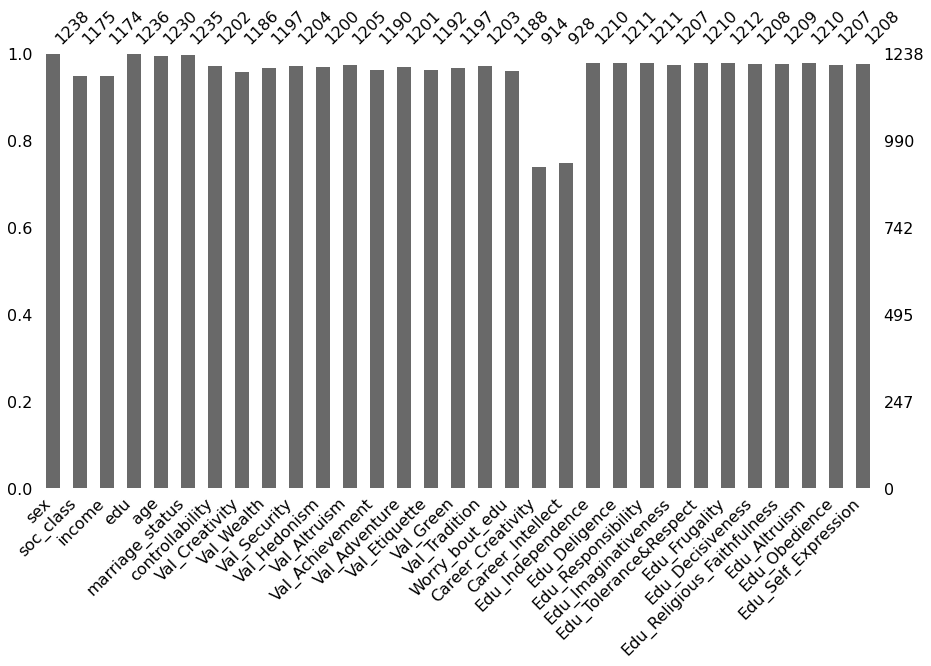

In [ ]:
msno.bar(df_log, figsize=(15,8))

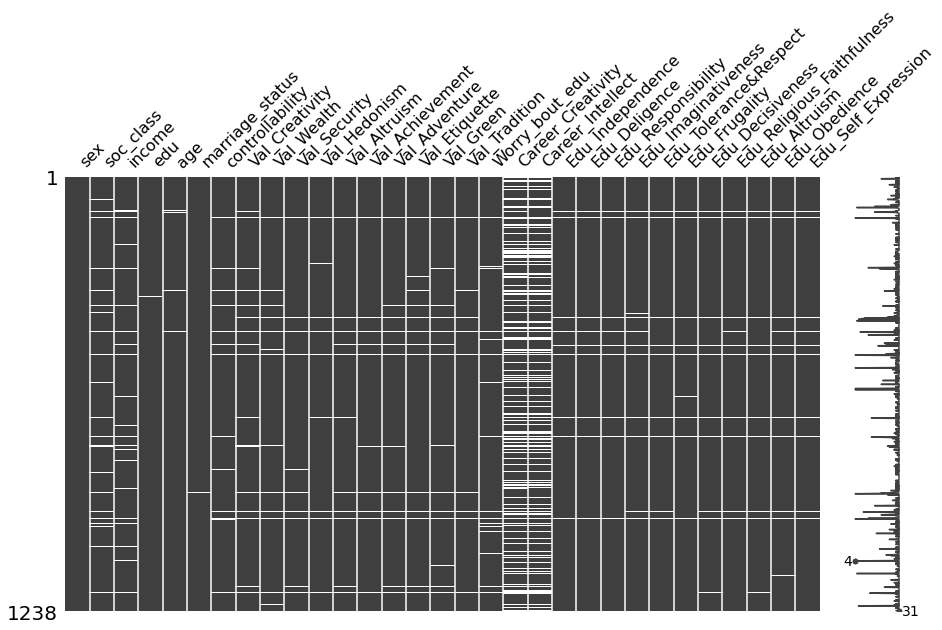

In [ ]:
msno.matrix(df_log,figsize=(15,8))

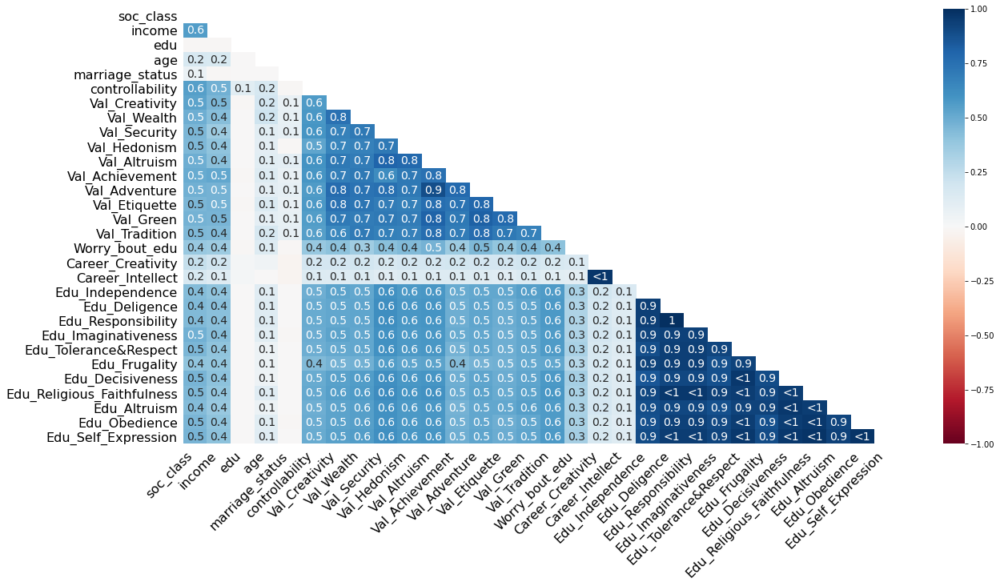

In [ ]:
msno.heatmap(df_log,figsize=(20,10))

In [ ]:
df_log.dropna(inplace=True)
df_log

,sex,soc_class,income,edu,age,marriage_status,controllability,Val_Creativity,Val_Wealth,Val_Security,Val_Hedonism,Val_Altruism,Val_Achievement,Val_Adventure,Val_Etiquette,Val_Green,Val_Tradition,Worry_bout_edu,Career_Creativity,Career_Intellect,Edu_Independence,Edu_Deligence,Edu_Responsibility,Edu_Imaginativeness,Edu_Tolerance&Respect,Edu_Frugality,Edu_Decisiveness,Edu_Religious_Faithfulness,Edu_Altruism,Edu_Obedience,Edu_Self_Expression
0,male,3.0,6.0,3.0,28.0,single,7.0,5.0,4.0,4.0,5.0,5.0,5.0,5.0,4.0,5.0,3.0,3.0,5.0,5.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
2,female,4.0,5.0,2.0,48.0,married,8.0,4.0,4.0,6.0,5.0,5.0,2.0,1.0,6.0,5.0,5.0,4.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,male,3.0,4.0,3.0,59.0,married,6.0,3.0,3.0,6.0,5.0,5.0,4.0,2.0,4.0,5.0,5.0,3.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
5,female,2.0,5.0,5.0,37.0,single,8.0,3.0,3.0,5.0,5.0,4.0,3.0,3.0,5.0,4.0,4.0,4.0,6.0,5.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,male,4.0,5.0,3.0,68.0,married,7.0,4.0,4.0,5.0,3.0,6.0,3.0,2.0,5.0,6.0,5.0,3.0,3.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1232,female,3.0,5.0,5.0,45.0,married,9.0,3.0,2.0,4.0,5.0,5.0,2.0,2.0,4.0,5.0,5.0,4.0,3.0,6.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
1233,male,4.0,3.0,2.0,68.0,married,8.0,2.0,2.0,4.0,3.0,4.0,3.0,2.0,5.0,5.0,5.0,3.0,3.0,5.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1234,female,2.0,6.0,3.0,66.0,single,10.0,2.0,2.0,5.0,5.0,5.0,4.0,1.0,4.0,4.0,5.0,3.0,6.0,9.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
1235,female,4.0,3.0,2.0,48.0,widowed,7.0,3.0,2.0,6.0,6.0,5.0,1.0,1.0,5.0,4.0,4.0,3.0,2.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0


### Data Profiling

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5]),
 <a list of 29 Text major ticklabel objects>)

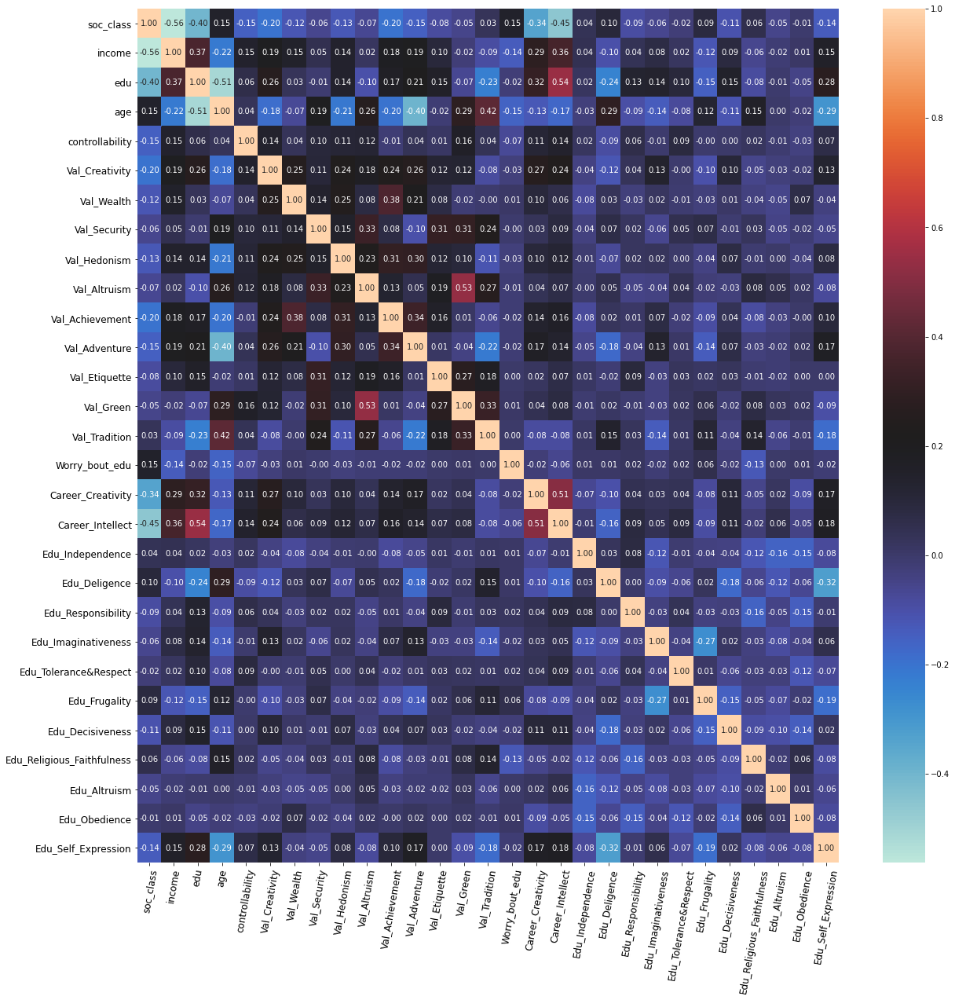

In [ ]:
plt.figure(figsize=(20,20))
c= df_log.corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12)

In [ ]:
df_log.columns

Index(['sex', 'soc_class', 'income', 'edu', 'age', 'marriage_status',
       'controllability', 'Val_Creativity', 'Val_Wealth', 'Val_Security',
       'Val_Hedonism', 'Val_Altruism', 'Val_Achievement', 'Val_Adventure',
       'Val_Etiquette', 'Val_Green', 'Val_Tradition', 'Worry_bout_edu',
       'Career_Creativity', 'Career_Intellect', 'Edu_Independence',
       'Edu_Deligence', 'Edu_Responsibility', 'Edu_Imaginativeness',
       'Edu_Tolerance&Respect', 'Edu_Frugality', 'Edu_Decisiveness',
       'Edu_Religious_Faithfulness', 'Edu_Altruism', 'Edu_Obedience',
       'Edu_Self_Expression'],
      dtype='object')

(array([0.5, 1.5, 2.5, 3.5, 4.5]), <a list of 5 Text major ticklabel objects>)

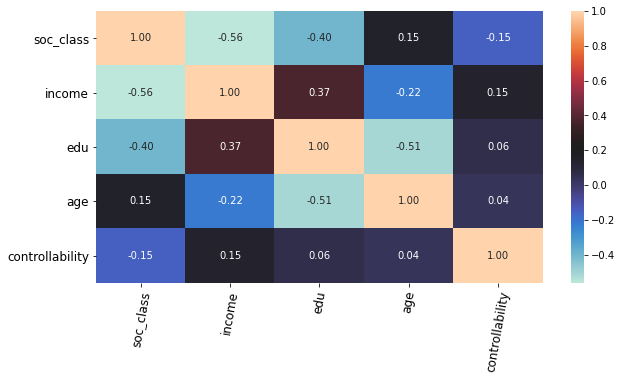

In [ ]:
# Correlation btwn ctrl_vb
plt.figure(figsize=(10,5))
c= df_log.iloc[:,0:7].corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12, rotation=0)

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5]), <a list of 13 Text major ticklabel objects>)

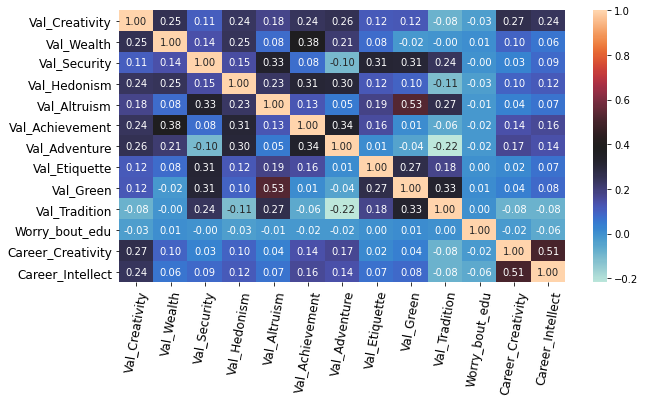

In [ ]:
# Correlation btwn ind_vb
plt.figure(figsize=(10,5))
c= df_log.iloc[:,7:20].corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12, rotation=0)

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5]),
 <a list of 11 Text major ticklabel objects>)

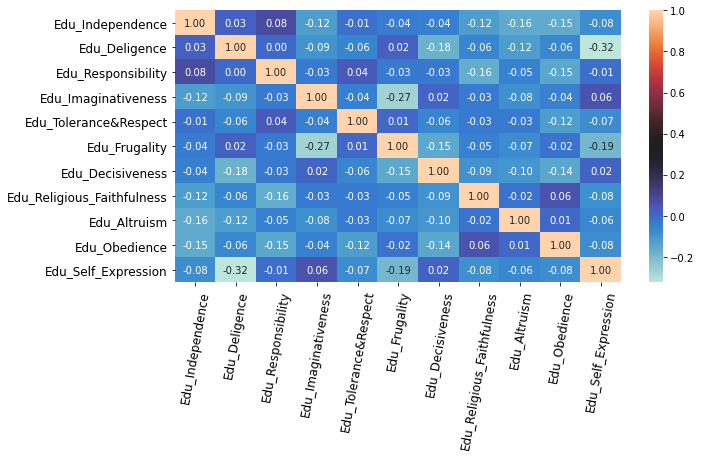

In [ ]:
# Correlation btwn dpd_vb
plt.figure(figsize=(10,5))
c= df_log.iloc[:,20:].corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12, rotation=0)

### Check Point

In [ ]:
df_ctrl_vb = df_log[['soc_class','edu','Career_Creativity','Career_Intellect']]

In [ ]:
df_log = pd.concat([df_ctrl_vb,df_ind_vb.drop(columns=['Worry_bout_edu','Career_Creativity','Career_Intellect']),df_dpd_vb], axis = 1)
df_log.dropna(inplace=True)
df_log

,soc_class,edu,Career_Creativity,Career_Intellect,Val_Creativity,Val_Wealth,Val_Security,Val_Hedonism,Val_Altruism,Val_Achievement,Val_Adventure,Val_Etiquette,Val_Green,Val_Tradition,Edu_Independence,Edu_Deligence,Edu_Responsibility,Edu_Imaginativeness,Edu_Tolerance&Respect,Edu_Frugality,Edu_Decisiveness,Edu_Religious_Faithfulness,Edu_Altruism,Edu_Obedience,Edu_Self_Expression
0,3.0,3.0,5.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,5.0,4.0,5.0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
2,4.0,2.0,1.0,1.0,4.0,4.0,6.0,5.0,5.0,2.0,1.0,6.0,5.0,5.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,3.0,3.0,5.0,5.0,3.0,3.0,6.0,5.0,5.0,4.0,2.0,4.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
5,2.0,5.0,6.0,5.0,3.0,3.0,5.0,5.0,4.0,3.0,3.0,5.0,4.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,4.0,3.0,3.0,5.0,4.0,4.0,5.0,3.0,6.0,3.0,2.0,5.0,6.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1232,3.0,5.0,3.0,6.0,3.0,2.0,4.0,5.0,5.0,2.0,2.0,4.0,5.0,5.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
1233,4.0,2.0,3.0,5.0,2.0,2.0,4.0,3.0,4.0,3.0,2.0,5.0,5.0,5.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
1234,2.0,3.0,6.0,9.0,2.0,2.0,5.0,5.0,5.0,4.0,1.0,4.0,4.0,5.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
1235,4.0,2.0,2.0,2.0,3.0,2.0,6.0,6.0,5.0,1.0,1.0,5.0,4.0,4.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
df_log.to_csv('df_log.csv')

## Logistic Regression

In [ ]:
import statsmodels.api as sm
import pandas as pd
df = pd.read_csv('df_log.csv')
df.drop(columns='Unnamed: 0',inplace=True)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
df

,soc_class,edu,Career_Creativity,Career_Intellect,Val_Creativity,Val_Wealth,Val_Security,Val_Hedonism,Val_Altruism,Val_Achievement,Val_Adventure,Val_Etiquette,Val_Green,Val_Tradition,Edu_Independence,Edu_Deligence,Edu_Responsibility,Edu_Imaginativeness,Edu_Tolerance&Respect,Edu_Frugality,Edu_Decisiveness,Edu_Religious_Faithfulness,Edu_Altruism,Edu_Obedience,Edu_Self_Expression
0,3.0,3.0,5.0,5.0,5.0,4.0,4.0,5.0,5.0,5.0,5.0,4.0,5.0,3.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
1,4.0,2.0,1.0,1.0,4.0,4.0,6.0,5.0,5.0,2.0,1.0,6.0,5.0,5.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,3.0,3.0,5.0,5.0,3.0,3.0,6.0,5.0,5.0,4.0,2.0,4.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
3,2.0,5.0,6.0,5.0,3.0,3.0,5.0,5.0,4.0,3.0,3.0,5.0,4.0,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4.0,3.0,3.0,5.0,4.0,4.0,5.0,3.0,6.0,3.0,2.0,5.0,6.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
823,3.0,5.0,3.0,6.0,3.0,2.0,4.0,5.0,5.0,2.0,2.0,4.0,5.0,5.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
824,4.0,2.0,3.0,5.0,2.0,2.0,4.0,3.0,4.0,3.0,2.0,5.0,5.0,5.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
825,2.0,3.0,6.0,9.0,2.0,2.0,5.0,5.0,5.0,4.0,1.0,4.0,4.0,5.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
826,4.0,2.0,2.0,2.0,3.0,2.0,6.0,6.0,5.0,1.0,1.0,5.0,4.0,4.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
df['Intercept'] = 1

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import cohen_kappa_score, accuracy_score, roc_auc_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### without Regularization

Optimization terminated successfully.
         Current function value: 0.454954
         Iterations 6
                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         15:32:00   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                 3.014e-07
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.5884      0.097    -16.393      0.000      -1.778      -1.398
edu      

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

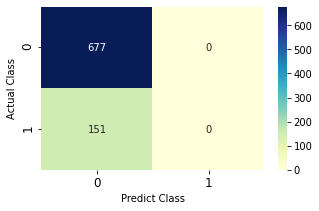

In [ ]:
df_x = df[['edu','Val_Creativity', 'Val_Tradition']] 
y = df[['Edu_Imaginativeness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.624654
         Iterations 5
                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06369
Time:                         15:16:50   Log-Likelihood:                -517.21
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:                 3.567e-15
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.5073      0.075     -6.733      0.000      -0.655      -0.360
edu      

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

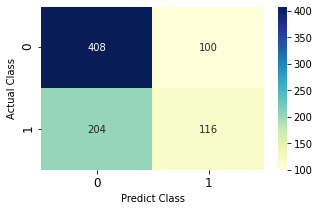

In [ ]:
df_x = df[['edu','Val_Creativity', 'Val_Tradition']] 
y = df[['Edu_Self_Expression']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.280804
         Iterations 7
                               Logit Regression Results                               
Dep. Variable:     Edu_Religious_Faithfulness   No. Observations:                  828
Model:                                  Logit   Df Residuals:                      824
Method:                                   MLE   Df Model:                            3
Date:                        Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04028
Time:                                15:17:14   Log-Likelihood:                -232.51
converged:                               True   LL-Null:                       -242.26
Covariance Type:                    nonrobust   LLR p-value:                 0.0002137
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -2.5099      0.142

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

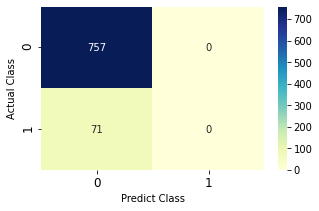

In [ ]:
df_x = df[['edu','Val_Creativity', 'Val_Tradition']] 
y = df[['Edu_Religious_Faithfulness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.643484
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04087
Time:                        15:17:27   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:                 7.599e-10
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.4516      0.073     -6.147      0.000      -0.596      -0.308
edu              

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

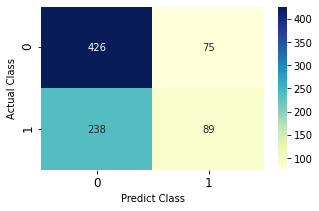

In [ ]:
df_x = df[['edu','Val_Creativity', 'Val_Tradition']] 
y = df[['Edu_Deligence']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.645711
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        15:17:49   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:                 8.744e-10
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.4466      0.073     -6.104      0.000      -0.590      -0.303
edu           

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

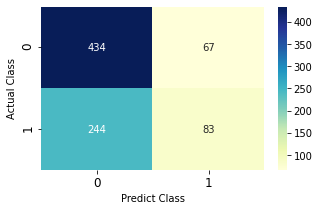

In [ ]:
df_x = df[['edu', 'Val_Achievement']] 
y = df[['Edu_Deligence']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.665359
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        15:17:59   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:                 1.549e-07
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           0.2785      0.072      3.890      0.000       0.138       0.419
edu           

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

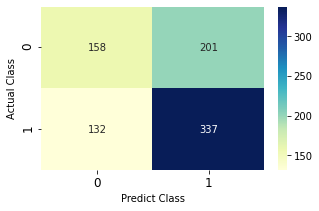

In [ ]:
df_x = df[['edu', 'Val_Achievement']] 
y = df[['Edu_Frugality']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.461352
         Iterations 6
                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         15:18:07   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                 1.274e-05
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -1.5609      0.095    -16.461      0.000      -1.747      -1.375
edu   

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

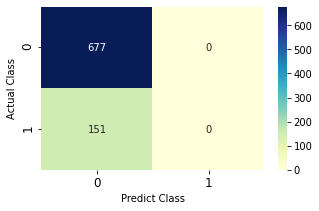

In [ ]:
df_x = df[['edu', 'Val_Achievement']] 
y = df[['Edu_Imaginativeness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.457300
         Iterations 6
                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         15:18:16   Log-Likelihood:                -378.64
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                 4.448e-07
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -1.5774      0.096    -16.421      0.000      -1.766      -1.389
edu         

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

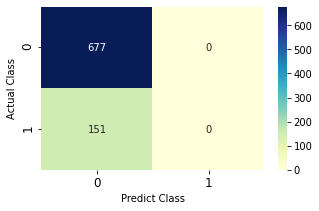

In [ ]:
df_x = df[['edu', 'Val_Adventure']] 
y = df[['Edu_Imaginativeness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

Optimization terminated successfully.
         Current function value: 0.628802
         Iterations 5
                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         15:18:37   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:                 1.630e-14
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -0.5044      0.075     -6.723      0.000      -0.651      -0.357
edu         

(array([0.5, 1.5]), <a list of 2 Text major ticklabel objects>)

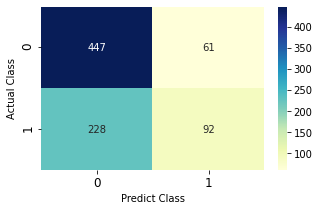

In [ ]:
df_x = df[['edu', 'Val_Adventure']] 
y = df[['Edu_Self_Expression']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

log_reg = sm.Logit(y, x).fit() 
print(log_reg.summary())

# Model Evaluation
y_hat = log_reg.predict(x)
prediction = list(map(round, y_hat))
cm = confusion_matrix(y, prediction)
auc = roc_auc_score(y, prediction)
kappa = cohen_kappa_score(y, prediction)
acc = accuracy_score(y, prediction)
print('AUC score: ', auc)
print('Accuracy: ', acc)
print('Cohen\'s Kappa: ', kappa)

plt.figure(figsize=(5,3))
sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
plt.xticks(size=12)
plt.xlabel('Predict Class')
plt.ylabel('Actual Class')
plt.yticks(size=12)

### with Regularization

In [ ]:
alphas_grid = np.logspace(-4, 4, num = 100)
alphas_grid

array([1.00000000e-04, 1.20450354e-04, 1.45082878e-04, 1.74752840e-04,
       2.10490414e-04, 2.53536449e-04, 3.05385551e-04, 3.67837977e-04,
       4.43062146e-04, 5.33669923e-04, 6.42807312e-04, 7.74263683e-04,
       9.32603347e-04, 1.12332403e-03, 1.35304777e-03, 1.62975083e-03,
       1.96304065e-03, 2.36448941e-03, 2.84803587e-03, 3.43046929e-03,
       4.13201240e-03, 4.97702356e-03, 5.99484250e-03, 7.22080902e-03,
       8.69749003e-03, 1.04761575e-02, 1.26185688e-02, 1.51991108e-02,
       1.83073828e-02, 2.20513074e-02, 2.65608778e-02, 3.19926714e-02,
       3.85352859e-02, 4.64158883e-02, 5.59081018e-02, 6.73415066e-02,
       8.11130831e-02, 9.77009957e-02, 1.17681195e-01, 1.41747416e-01,
       1.70735265e-01, 2.05651231e-01, 2.47707636e-01, 2.98364724e-01,
       3.59381366e-01, 4.32876128e-01, 5.21400829e-01, 6.28029144e-01,
       7.56463328e-01, 9.11162756e-01, 1.09749877e+00, 1.32194115e+00,
       1.59228279e+00, 1.91791026e+00, 2.31012970e+00, 2.78255940e+00,
      

In [ ]:
alphas_grid = np.arange(-4, 4, 0.08)
alphas_grid

array([-4.00000000e+00, -3.92000000e+00, -3.84000000e+00, -3.76000000e+00,
       -3.68000000e+00, -3.60000000e+00, -3.52000000e+00, -3.44000000e+00,
       -3.36000000e+00, -3.28000000e+00, -3.20000000e+00, -3.12000000e+00,
       -3.04000000e+00, -2.96000000e+00, -2.88000000e+00, -2.80000000e+00,
       -2.72000000e+00, -2.64000000e+00, -2.56000000e+00, -2.48000000e+00,
       -2.40000000e+00, -2.32000000e+00, -2.24000000e+00, -2.16000000e+00,
       -2.08000000e+00, -2.00000000e+00, -1.92000000e+00, -1.84000000e+00,
       -1.76000000e+00, -1.68000000e+00, -1.60000000e+00, -1.52000000e+00,
       -1.44000000e+00, -1.36000000e+00, -1.28000000e+00, -1.20000000e+00,
       -1.12000000e+00, -1.04000000e+00, -9.60000000e-01, -8.80000000e-01,
       -8.00000000e-01, -7.20000000e-01, -6.40000000e-01, -5.60000000e-01,
       -4.80000000e-01, -4.00000000e-01, -3.20000000e-01, -2.40000000e-01,
       -1.60000000e-01, -8.00000000e-02,  3.55271368e-15,  8.00000000e-02,
        1.60000000e-01,  

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553549410272108
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.14

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:32   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45535722894876957
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  9
Alpha: 0.14079999999999993

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4447
Time:                         16:59:33   Log-Likelihood:                -568.16
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553578009071088
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  11
Alpha: 0.1409999999999999

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4447
Time:                         16:59:33   Log-Likelihood:                -568.16
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45535837286312364
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  13
Alpha: 0.14119999999999988

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4447
Time:                         16:59:33   Log-Likelihood:                -568.16
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45535894481669537
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  15
Alpha: 0.14139999999999986

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:34   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45535980274326726
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  18
Alpha: 0.14169999999999983

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:35   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536037469274937
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  20
Alpha: 0.1418999999999998

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:35   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.455360946637034
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  22
Alpha: 0.14209999999999978

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:35   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553615185794648
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  24
Alpha: 0.14229999999999976

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:36   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553620905204164
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  26
Alpha: 0.14249999999999974

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:36   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536266246381846
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  28
Alpha: 0.14269999999999972

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:36   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553632344064907
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  30
Alpha: 0.1428999999999997

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:37   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536380634761614
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  32
Alpha: 0.14309999999999967

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:37   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553643782872204
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  34
Alpha: 0.14329999999999965

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:37   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553649502252898
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  36
Alpha: 0.14349999999999963

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04213
Time:                         16:59:37   Log-Likelihood:                -376.70
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536552221767795
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  38
Alpha: 0.1436999999999996

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4447
Time:                         16:59:38   Log-Likelihood:                -568.16
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536609414615625
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  40
Alpha: 0.14389999999999958

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:38   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536666607403564
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  42
Alpha: 0.14409999999999956

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:38   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.455367238001042
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  44
Alpha: 0.14429999999999954

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:39   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553678099269611
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  46
Alpha: 0.14449999999999952

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:39   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45536838185165074
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  48
Alpha: 0.1446999999999995

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:39   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553689537750282
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  50
Alpha: 0.14489999999999947

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:40   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553695256970487
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  52
Alpha: 0.14509999999999945

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:40   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:40   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                     1.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept               0        nan        nan        nan         nan         nan
edu                0.2821      0.076      3.713      0.000       0.133       0.431
Val_Creativity     0.2531   

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553703835774771
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.14539999999999942

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:41   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537095549599405
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.1455999999999994

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:41   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553715274130657
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.14579999999999937

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:41   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553720993286624
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.14599999999999935

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:41   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553726712427531
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.14619999999999933

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:42   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537324315530614
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.1463999999999993

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:42   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553738150662906
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  67
Alpha: 0.1465999999999993

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:42   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553743869756406
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  69
Alpha: 0.14679999999999926

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:43   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553749588829932
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  71
Alpha: 0.14699999999999924

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:43   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537553078858267
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  73
Alpha: 0.14719999999999922

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:43   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.455376102692406
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  75
Alpha: 0.1473999999999992

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:44   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR 

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537667459445985
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  77
Alpha: 0.14759999999999918

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:44   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537724649474026
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  79
Alpha: 0.14779999999999915

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:44   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537781839324265
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  81
Alpha: 0.14799999999999913

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:44   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553783902899617
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  83
Alpha: 0.1481999999999991

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:45   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45537896218490154
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  85
Alpha: 0.1483999999999991

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:45   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553795340780644
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  87
Alpha: 0.14859999999999907

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:45   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553801059694293
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  89
Alpha: 0.14879999999999904

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:46   Log-Likelihood:                -568.74
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553806778589893
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  91
Alpha: 0.14899999999999902

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:46   Log-Likelihood:                -568.73
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45538124974673766
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  93
Alpha: 0.149199999999999

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:47   Log-Likelihood:                -568.73
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553818216326679
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  95
Alpha: 0.14939999999999898

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:47   Log-Likelihood:                -568.73
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553823935167742
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  97
Alpha: 0.14959999999999896

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:47   Log-Likelihood:                -568.73
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4553829653990508
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  99
Alpha: 0.14979999999999893

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:48   Log-Likelihood:                -568.73
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 -0.4462
Time:                         16:59:48   Log-Likelihood:                -568.73
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                     1.000
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept               0        nan        nan        nan         nan         nan
edu                0.2820      0.076      3.712      0.000       0.133       0.431
Val_Creativity     0.2530   

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


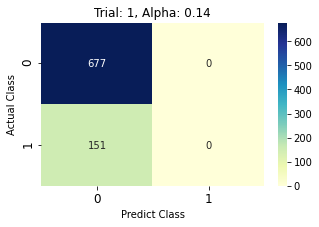

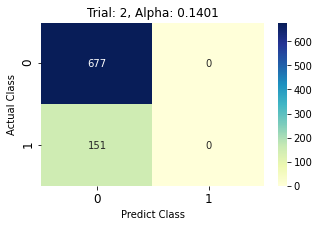

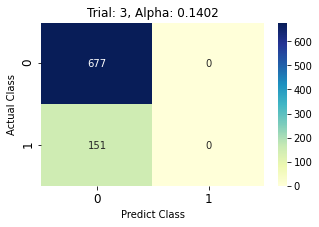

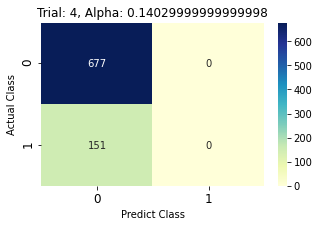

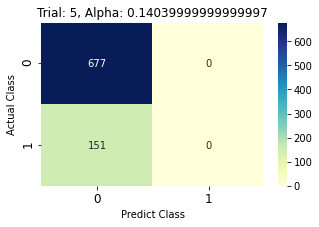

...

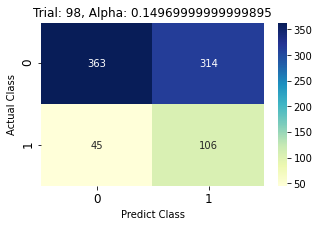

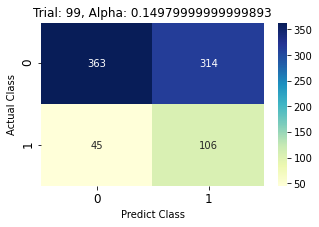

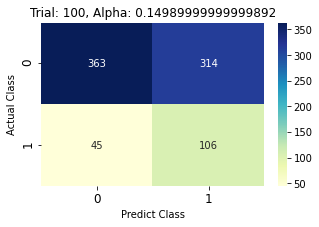

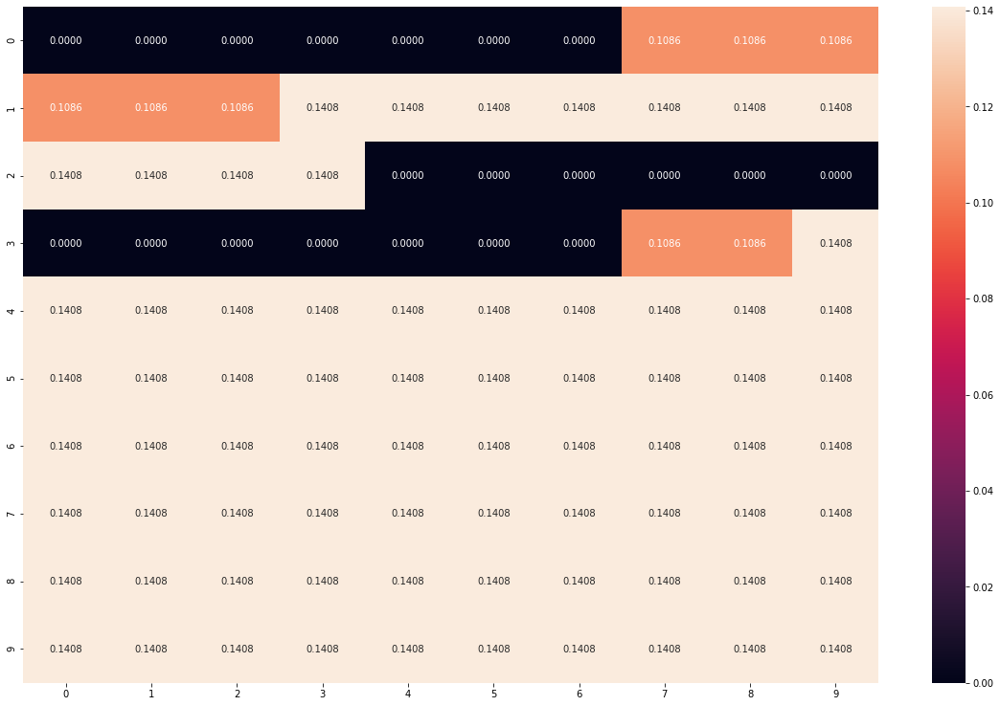

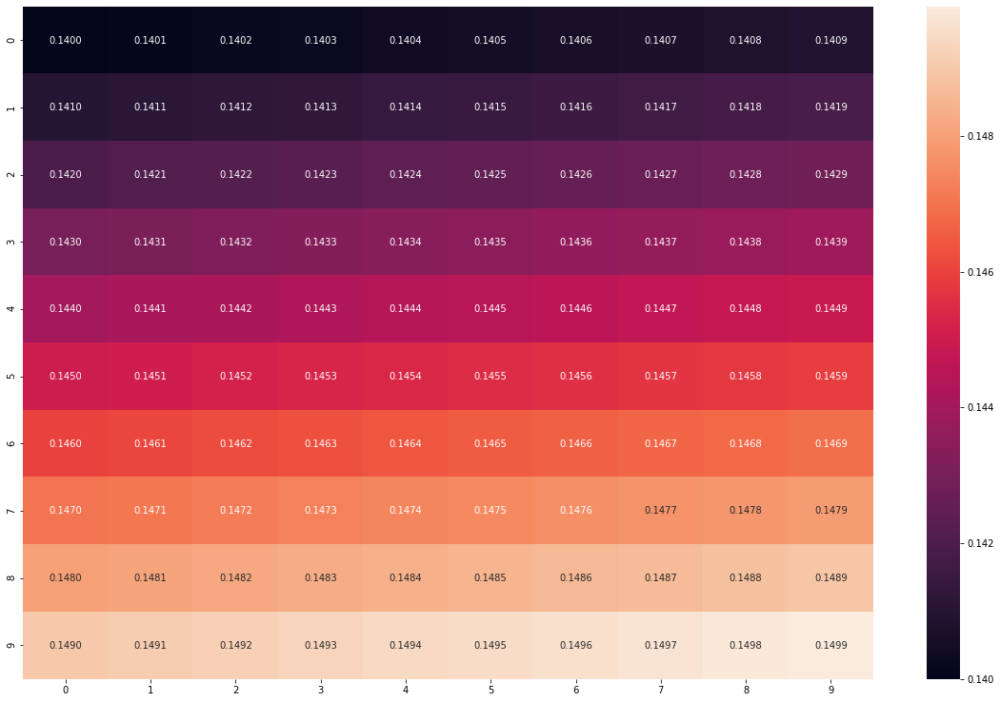

In [ ]:
df_x = df[['edu','Val_Creativity', 'Val_Tradition']]  # Done
y = df[['Edu_Imaginativeness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0.14, 0.15, 0.0001)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list]).reshape(10,10)
plt.figure(figsize=(20,13))
sns.heatmap(kappa_arr, annot=True, fmt=".4f")

alphas_grid = alphas_grid.reshape(10,10)
plt.figure(figsize=(20,13))
sns.heatmap(alphas_grid, annot=True, fmt=".4f")

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258085011709575
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.7

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:25   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:       

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258445782418066
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  23
Alpha: 0.722

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:28   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258478573386874
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  25
Alpha: 0.724

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:29   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258511363318671
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  27
Alpha: 0.726

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:29   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258544152213097
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  29
Alpha: 0.728

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:30   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258576940069879
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  31
Alpha: 0.73

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:30   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258609726888839
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  33
Alpha: 0.732

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:30   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258642512669911
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  35
Alpha: 0.734

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:31   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.625867529741316
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  37
Alpha: 0.736

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:31   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258708081118778
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  39
Alpha: 0.738

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:31   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258740863787103
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  41
Alpha: 0.74

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:31   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258773645418628
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  43
Alpha: 0.742

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:32   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258806426014001
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  45
Alpha: 0.744

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:32   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258839205574028
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  47
Alpha: 0.746

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:32   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258871984099688
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  49
Alpha: 0.748

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:33   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258904761592126
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  51
Alpha: 0.75

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:33   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.625893753805266
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  53
Alpha: 0.752

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:33   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6258970313482788
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.754

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:33   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259003087854895
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.756

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:34   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259035861139485
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.758

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:34   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259068633440822
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.76

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:34   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259101404757568
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.762

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:35   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259134175088173
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.764

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:35   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259166944430905
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  67
Alpha: 0.766

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:35   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.625918332873122
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  68
Alpha: 0.767

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:36   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259216096588447
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  70
Alpha: 0.769

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:36   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259248863452594
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  72
Alpha: 0.771

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:36   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259281629321243
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  74
Alpha: 0.773

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:37   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259314394191784
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  76
Alpha: 0.775

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:37   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259347158061429
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  78
Alpha: 0.777

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:37   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259379920927203
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  80
Alpha: 0.779

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:37   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259412682785971
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  82
Alpha: 0.781

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:38   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259445443634436
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  84
Alpha: 0.783

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:38   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259478203469163
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  86
Alpha: 0.785

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:38   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259510962286595
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  88
Alpha: 0.787

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:39   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259543720083086
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  90
Alpha: 0.789

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:39   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259576476854912
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  92
Alpha: 0.791

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:39   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.625960923259832
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  94
Alpha: 0.793

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:39   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259641987309562
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  96
Alpha: 0.795

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:40   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259674740984928
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  98
Alpha: 0.797

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:40   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6259707493620794
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  100
Alpha: 0.799

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      824
Method:                            MLE   Df Model:                            3
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.06368
Time:                         17:21:40   Log-Likelihood:                -517.22
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:   

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


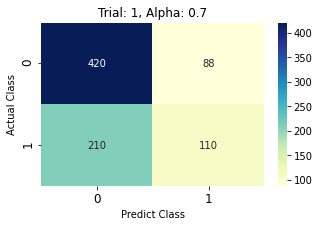

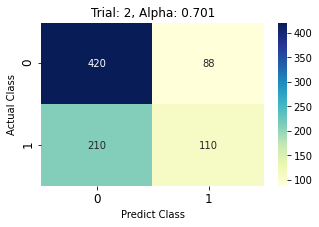

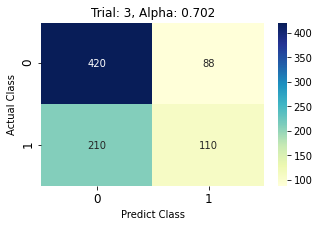

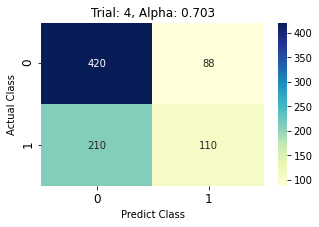

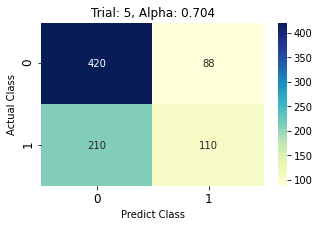

...

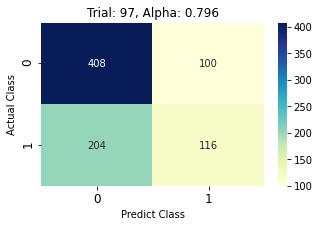

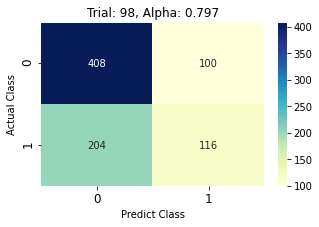

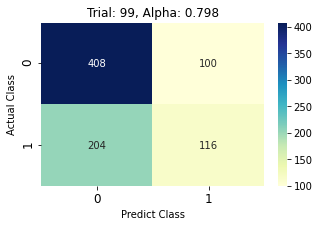

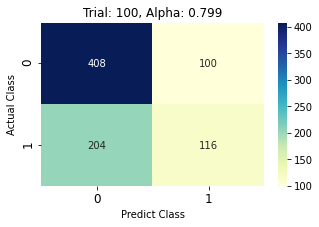

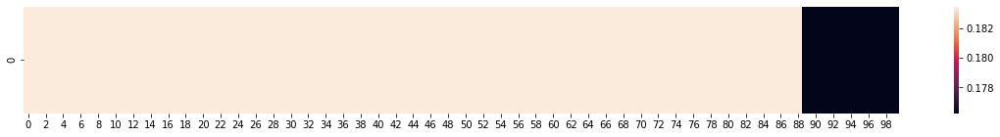

In [ ]:
df_x = df[['edu','Val_Creativity', 'Val_Tradition']]  # Done
y = df[['Edu_Self_Expression']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0.7, 0.799, 0.001)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list])
plt.figure(figsize=(20,2))
sns.heatmap(kappa_arr)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645765850258598
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.04

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.003056
Time:                        17:20:54   Log-Likelihood:                -553.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:               

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457661240571986
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  3
Alpha: 0.04020000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:54   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457663978539203
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  5
Alpha: 0.04040000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:54   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645766671650452
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  7
Alpha: 0.04060000000000002

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:54   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.64576694544617
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  9
Alpha: 0.040800000000000024

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:55   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457672192323435
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  11
Alpha: 0.04100000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:55   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457674930170305
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  13
Alpha: 0.041200000000000035

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:55   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457677668008323
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  15
Alpha: 0.04140000000000004

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:56   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457680405842486
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  17
Alpha: 0.04160000000000005

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.003056
Time:                        17:20:56   Log-Likelihood:                -553.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457683143677032
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  19
Alpha: 0.04180000000000005

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:56   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457688619360837
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  23
Alpha: 0.042200000000000064

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:57   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457691357221165
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  25
Alpha: 0.04240000000000007

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002570
Time:                        17:20:57   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645769409511732
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  27
Alpha: 0.042600000000000075

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002570
Time:                        17:20:57   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457696833026123
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  29
Alpha: 0.04280000000000008

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002570
Time:                        17:20:58   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457699570848096
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  31
Alpha: 0.04300000000000009

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002570
Time:                        17:20:58   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457702308625259
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  33
Alpha: 0.04320000000000009

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002570
Time:                        17:20:58   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457705046340197
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  35
Alpha: 0.0434000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002570
Time:                        17:20:58   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457707784055835
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  37
Alpha: 0.043600000000000104

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:20:59   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457710521802311
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  39
Alpha: 0.04380000000000011

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:20:59   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457713259483535
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  41
Alpha: 0.044000000000000115

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:20:59   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457715997308093
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  43
Alpha: 0.04420000000000012

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:00   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645771873497162
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  45
Alpha: 0.04440000000000013

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:01   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457721472910148
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  47
Alpha: 0.04460000000000013

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:21:01   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457724210452098
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  49
Alpha: 0.04480000000000014

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:21:01   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457726948303504
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  51
Alpha: 0.045000000000000144

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      827
Method:                           MLE   Df Model:                            0
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:              -6.863e-05
Time:                        17:21:01   Log-Likelihood:                -555.54
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645772968620957
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  53
Alpha: 0.04520000000000015

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      827
Method:                           MLE   Df Model:                            0
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:              -6.861e-05
Time:                        17:21:02   Log-Likelihood:                -555.54
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457732423474845
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.045400000000000156

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:02   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645773516114885
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.04560000000000016

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:02   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457737898813088
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.04580000000000017

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:03   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457740636467283
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.04600000000000017

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:03   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457743374111595
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.04620000000000018

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:03   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457746111746152
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.046400000000000184

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:03   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457748849370913
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  67
Alpha: 0.04660000000000019

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:04   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645775158698586
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  69
Alpha: 0.046800000000000196

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:04   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457754324590985
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  71
Alpha: 0.0470000000000002

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:04   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645775706262767
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  73
Alpha: 0.04720000000000021

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:21:05   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457759800173071
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  75
Alpha: 0.04740000000000021

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:21:05   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457762537725775
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  77
Alpha: 0.04760000000000022

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002571
Time:                        17:21:05   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645776527528544
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  79
Alpha: 0.047800000000000224

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002572
Time:                        17:21:06   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.645776801282924
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  81
Alpha: 0.04800000000000023

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002572
Time:                        17:21:06   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457770750323847
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  83
Alpha: 0.048200000000000236

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002572
Time:                        17:21:06   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457773487918519
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  85
Alpha: 0.04840000000000024

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002572
Time:                        17:21:06   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457776225522895
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  87
Alpha: 0.04860000000000025

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                0.002572
Time:                        17:21:07   Log-Likelihood:                -554.08
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/pytho

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457778962594989
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  89
Alpha: 0.04880000000000025

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:07   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457781700101863
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  91
Alpha: 0.04900000000000026

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:08   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457784437598917
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  93
Alpha: 0.049200000000000264

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:08   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457787175086146
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  95
Alpha: 0.04940000000000027

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:08   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457789912563554
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  97
Alpha: 0.049600000000000276

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:08   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457792650031146
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  99
Alpha: 0.04980000000000028

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:09   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6457795387488925
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  101
Alpha: 0.05000000000000029

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03755
Time:                        17:21:09   Log-Likelihood:                -534.65
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-val

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


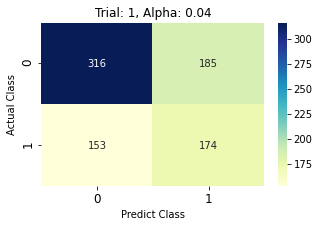

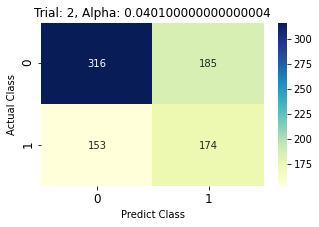

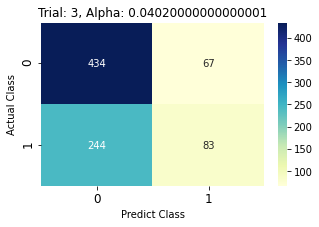

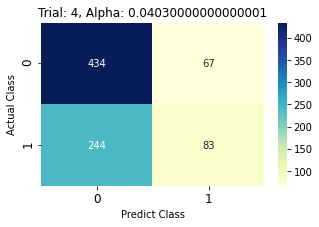

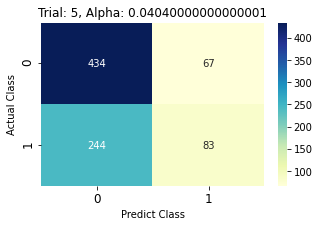

...

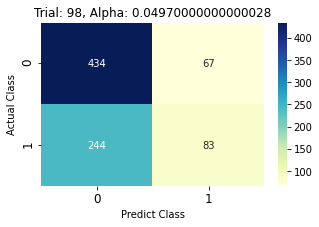

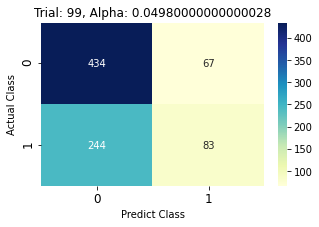

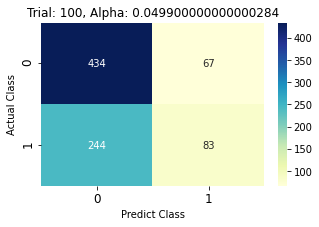

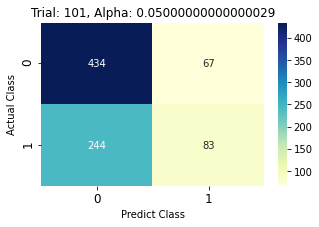

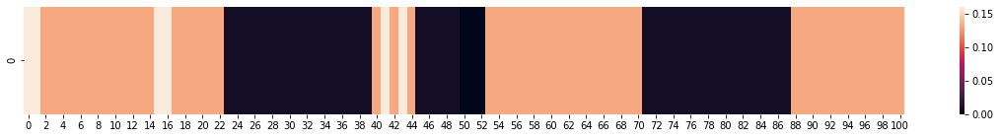

In [ ]:
df_x = df[['edu', 'Val_Achievement']] # Done
y = df[['Edu_Deligence']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0.04, 0.05, 0.0001)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list])
plt.figure(figsize=(20,2))
sns.heatmap(kappa_arr)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6653585912348665
            Iterations: 13
            Function evaluations: 13
            Gradient evaluations: 13

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:24:58   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:               

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6653772863332869
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  3
Alpha: 0.02

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02395
Time:                        17:24:58   Log-Likelihood:                -553.03
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 2 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6653959742922556
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  5
Alpha: 0.04

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:24:59   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6654333285749585
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  9
Alpha: 0.08

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:24:59   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6655638421856591
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  23
Alpha: 0.22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:01   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6655824582832195
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  25
Alpha: 0.24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:01   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6656010671020484
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  27
Alpha: 0.26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:02   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6656196687865297
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  29
Alpha: 0.28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:02   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6656382632875198
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  31
Alpha: 0.3

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:02   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6656568506211119
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  33
Alpha: 0.32

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:02   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6656754307407892
            Iterations: 20
            Function evaluations: 21
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  35
Alpha: 0.34

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:03   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6656940037041369
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  37
Alpha: 0.36

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:03   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6657125694694027
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  39
Alpha: 0.38

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:03   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6657311280635309
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  41
Alpha: 0.4

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:04   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6657496794803448
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  43
Alpha: 0.42

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:04   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6657682237173911
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  45
Alpha: 0.44

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:04   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6657867607674879
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  47
Alpha: 0.46

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:04   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6658052906482541
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  49
Alpha: 0.48

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:05   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6658238133472707
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  51
Alpha: 0.5

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:05   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6658423288729277
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  53
Alpha: 0.52

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:05   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.665860837223178
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.54

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:05   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6658793383987368
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.56

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:06   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6658978324006577
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.58

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:06   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6659163192305928
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.6

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:06   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6659347988913604
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.62

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:07   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6659532713871062
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.64

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:07   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6659717367155099
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  67
Alpha: 0.66

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:07   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6659901948379547
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  69
Alpha: 0.68

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:07   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6660086457963122
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  71
Alpha: 0.7000000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:08   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6660270895887087
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  73
Alpha: 0.72

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:08   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6660455262151203
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  75
Alpha: 0.74

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:08   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6660639556751966
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  77
Alpha: 0.76

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:08   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6660823779686497
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  79
Alpha: 0.78

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:09   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6661007930948356
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  81
Alpha: 0.8

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:09   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6661192010518638
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  83
Alpha: 0.8200000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:09   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6661376018461302
            Iterations: 17
            Function evaluations: 18
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  85
Alpha: 0.84

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:09   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6661559954759152
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  87
Alpha: 0.86

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02767
Time:                        17:25:10   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.666174381942058
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  89
Alpha: 0.88

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02766
Time:                        17:25:10   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6661927612455117
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  91
Alpha: 0.9

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02766
Time:                        17:25:10   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6662111333885024
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  93
Alpha: 0.92

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02766
Time:                        17:25:10   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6662294983741649
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  95
Alpha: 0.9400000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02766
Time:                        17:25:11   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6662478562071434
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  97
Alpha: 0.96

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02766
Time:                        17:25:11   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6662662068203419
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  99
Alpha: 0.98

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Frugality   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02766
Time:                        17:25:11   Log-Likelihood:                -550.92
converged:                       True   LL-Null:                       -566.60
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

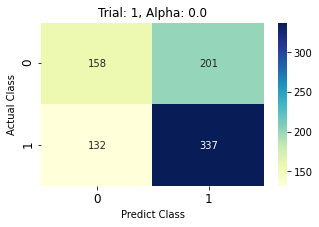

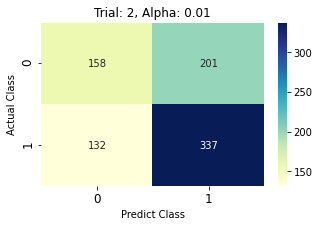

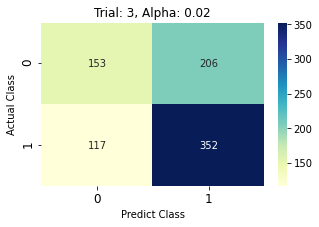

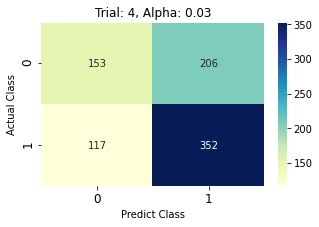

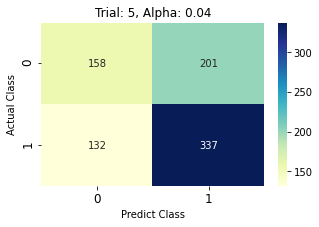

...

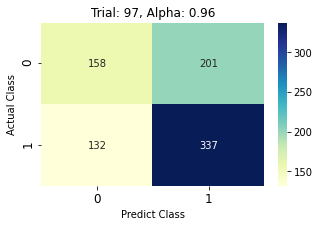

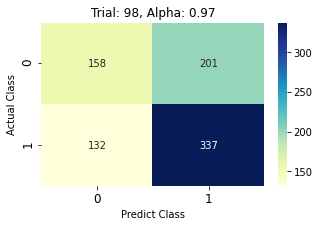

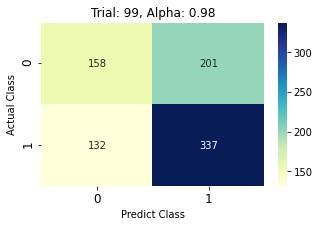

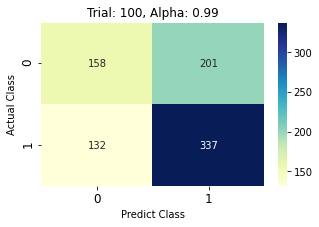

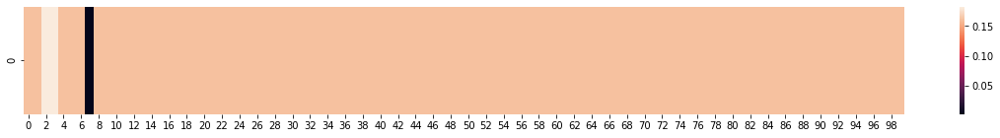

In [ ]:
df_x = df[['edu', 'Val_Achievement']] # Done
y = df[['Edu_Frugality']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0, 1, 0.01)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list])
plt.figure(figsize=(20,2))
sns.heatmap(kappa_arr)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6288019089552006
            Iterations: 11
            Function evaluations: 11
            Gradient evaluations: 11

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:16   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:       

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6288319089958342
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  3
Alpha: 0.02

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:16   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6289218572051872
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  9
Alpha: 0.08

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:17   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6290416668809493
            Iterations: 20
            Function evaluations: 21
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  17
Alpha: 0.16

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:18   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6291015197781996
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  21
Alpha: 0.2

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:19   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyp

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6291314332392189
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  23
Alpha: 0.22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:19   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6291613380432921
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  25
Alpha: 0.24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:19   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6291912342035447
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  27
Alpha: 0.26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:19   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6292211217245126
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  29
Alpha: 0.28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:20   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6292510005717212
            Iterations: 20
            Function evaluations: 21
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  31
Alpha: 0.3

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:20   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6292808707951736
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  33
Alpha: 0.32

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:20   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6293107323985001
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  35
Alpha: 0.34

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:20   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6293405852801496
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  37
Alpha: 0.36

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:21   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6293704295855346
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  39
Alpha: 0.38

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:21   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6294002651964251
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  41
Alpha: 0.4

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:21   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6294300921942079
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  43
Alpha: 0.42

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:22   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.629459910546007
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  45
Alpha: 0.44

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:22   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6294897202750214
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  47
Alpha: 0.46

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:23   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6295195213729411
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  49
Alpha: 0.48

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:23   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6295493137986024
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  51
Alpha: 0.5

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:24   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6295790976162629
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  53
Alpha: 0.52

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:24   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6296088728271466
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.54

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:24   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6296386393432563
            Iterations: 20
            Function evaluations: 21
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.56

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:24   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6296683972663014
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.58

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:25   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6296981465623082
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.6

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:25   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6297278872332217
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.62

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:25   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6297576192812844
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.64

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:26   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6297873426946641
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  67
Alpha: 0.66

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:26   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6298170574852385
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  69
Alpha: 0.68

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05747
Time:                         17:31:26   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6298467636555747
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  71
Alpha: 0.7000000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:26   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6298764612070729
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  73
Alpha: 0.72

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:27   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6299061501409547
            Iterations: 20
            Function evaluations: 21
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  75
Alpha: 0.74

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:27   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6299358304736834
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  77
Alpha: 0.76

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:27   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6299655021621205
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  79
Alpha: 0.78

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:28   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6299951652810959
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  81
Alpha: 0.8

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:28   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.630024819745884
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  83
Alpha: 0.8200000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:28   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6300544655863134
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  85
Alpha: 0.84

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:28   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6300841028624125
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  87
Alpha: 0.86

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:29   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6301137315300416
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  89
Alpha: 0.88

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:29   Log-Likelihood:                -520.65
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6301433515155679
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  91
Alpha: 0.9

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:29   Log-Likelihood:                -520.66
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6301729629465502
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  93
Alpha: 0.92

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:30   Log-Likelihood:                -520.66
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.630187765435059
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  94
Alpha: 0.93

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:30   Log-Likelihood:                -520.66
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6302173639574787
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  96
Alpha: 0.9500000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:30   Log-Likelihood:                -520.66
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6302469539154909
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  98
Alpha: 0.97

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:31   Log-Likelihood:                -520.66
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.630276535187628
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  100
Alpha: 0.99

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Self_Expression   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.05746
Time:                         17:31:31   Log-Likelihood:                -520.66
converged:                        True   LL-Null:                       -552.40
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


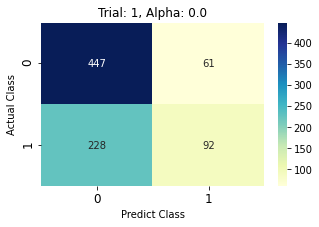

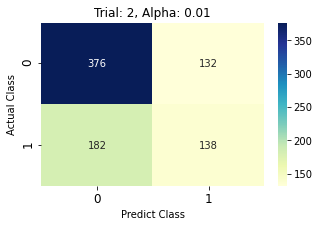

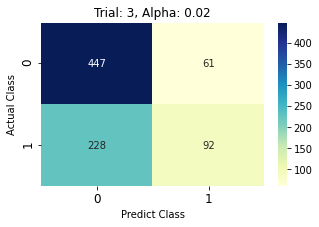

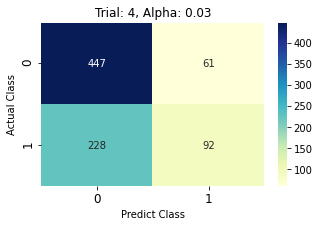

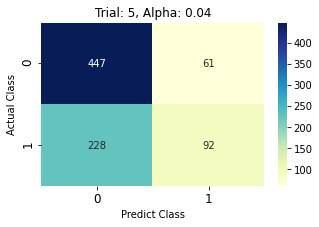

...

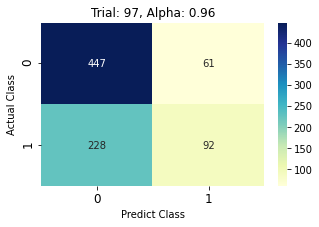

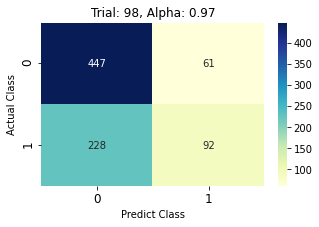

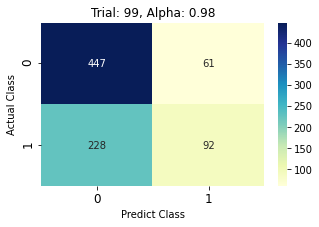

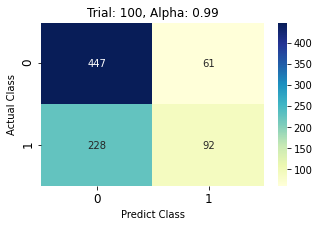

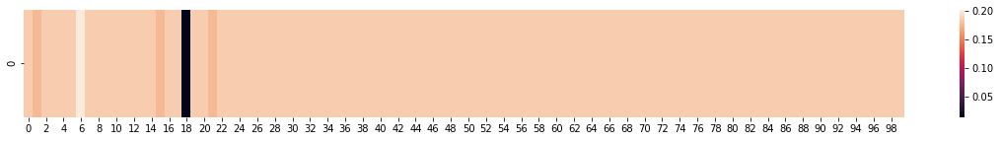

In [ ]:
df_x = df[['edu', 'Val_Adventure']] # Done
y = df[['Edu_Self_Expression']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0, 1, 0.01)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list])
plt.figure(figsize=(20,2))
sns.heatmap(kappa_arr)

### Lame still aft Regularization

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4573001868382275
            Iterations: 16
            Function evaluations: 16
            Gradient evaluations: 16

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:12   Log-Likelihood:                -378.64
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:       

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming us

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45735390462767445
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  3
Alpha: 0.02

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:12   Log-Likelihood:                -378.64
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45740760722964274
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  5
Alpha: 0.04

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:13   Log-Likelihood:                -378.64
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45746129466489094
            Iterations: 30
            Function evaluations: 30
            Gradient evaluations: 30

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  7
Alpha: 0.06

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:13   Log-Likelihood:                -378.64
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4575149670003768
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  9
Alpha: 0.08

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02262
Time:                         17:34:13   Log-Likelihood:                -384.38
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45756862413690375
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  11
Alpha: 0.1

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02262
Time:                         17:34:14   Log-Likelihood:                -384.38
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02262
Time:                         17:34:14   Log-Likelihood:                -384.38
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                 2.469e-05
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -1.5760      0.094    -16.713      0.000      -1.761      -1.391
edu               0.3532      0.097      3.627      0.000       0.162       0.544
Val_Adventure          0        

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4577027007351192
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  16
Alpha: 0.15

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:14   Log-Likelihood:                -378.64
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45786346784527215
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  22
Alpha: 0.21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:15   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45791702664549366
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  24
Alpha: 0.23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:15   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45797057033106275
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  26
Alpha: 0.25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:16   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45802409895828655
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  28
Alpha: 0.27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:16   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4580776124022964
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  30
Alpha: 0.29

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:16   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45813111079707364
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  32
Alpha: 0.31

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:17   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4581845941438242
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  34
Alpha: 0.33

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03719
Time:                         17:34:17   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45823806233245357
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  36
Alpha: 0.35000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:17   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4582915155008788
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  38
Alpha: 0.37

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:17   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4583449535650334
            Iterations: 21
            Function evaluations: 22
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  40
Alpha: 0.39

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:18   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45839837659029103
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  42
Alpha: 0.41000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:19   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4584517845510431
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  44
Alpha: 0.43

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:19   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4585051774511251
            Iterations: 21
            Function evaluations: 21
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  46
Alpha: 0.45

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:19   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4585585553194258
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  48
Alpha: 0.47000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:20   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45861191813505575
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  50
Alpha: 0.49

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:20   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


AUC score:  0.5
Accuracy:  0.8176328502415459
Cohen's Kappa:  0.0
Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45866526594346396
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  52
Alpha: 0.51

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:20   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45869193415604625
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  53
Alpha: 0.52

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:20   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45874525938530336
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.54

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:21   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4587985696006794
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.56

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:21   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4588518648010782
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.58

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:21   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4589051449989522
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.6

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03718
Time:                         17:34:22   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45895841021903033
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.62

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:22   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45901166035890684
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.64

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:22   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4590648955439018
            Iterations: 18
            Function evaluations: 19
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  67
Alpha: 0.66

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:22   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4591181157567744
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  69
Alpha: 0.68

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:23   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4591713209716679
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  71
Alpha: 0.7000000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:23   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4592245112095553
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  73
Alpha: 0.72

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:23   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4592776864815802
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  75
Alpha: 0.74

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:24   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4593308467908192
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  77
Alpha: 0.76

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:24   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4593839921269737
            Iterations: 16
            Function evaluations: 17
            Gradient evaluations: 16

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  79
Alpha: 0.78

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03717
Time:                         17:34:24   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4594371225316615
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  81
Alpha: 0.8

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:25   Log-Likelihood:                -378.65
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4594902379643069
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  83
Alpha: 0.8200000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:25   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4595433384537534
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  85
Alpha: 0.84

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:25   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.459596424032056
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  87
Alpha: 0.86

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:25   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45964949466891003
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  89
Alpha: 0.88

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:26   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4597025503626606
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  91
Alpha: 0.9

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:26   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4597555911346992
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  93
Alpha: 0.92

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03716
Time:                         17:34:27   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45980861699212283
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  95
Alpha: 0.9400000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03715
Time:                         17:34:27   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4598616279417761
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  97
Alpha: 0.96

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03715
Time:                         17:34:27   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.45991462398781646
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  99
Alpha: 0.98

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03715
Time:                         17:34:28   Log-Likelihood:                -378.66
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

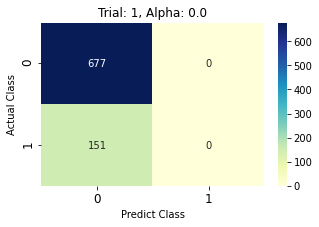

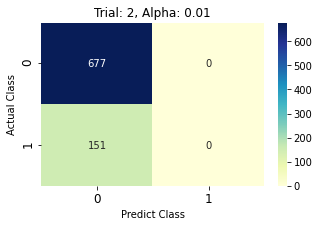

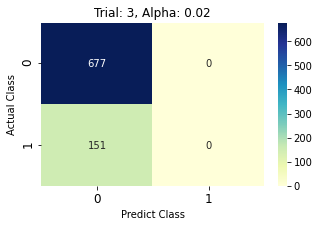

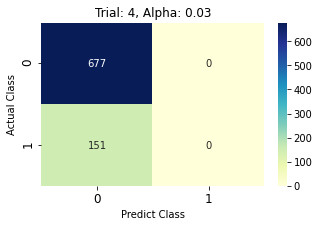

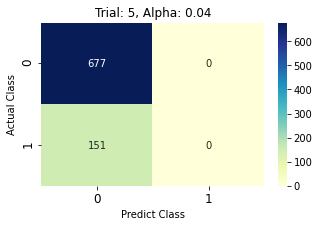

...

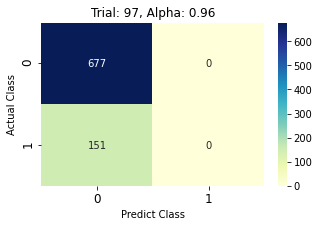

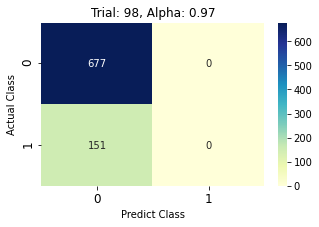

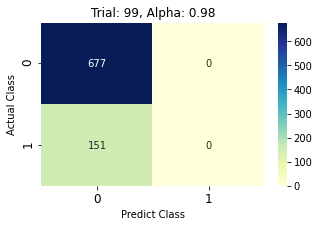

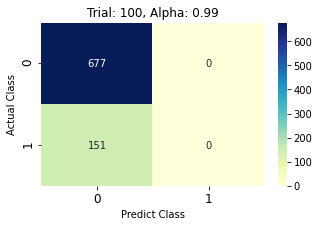

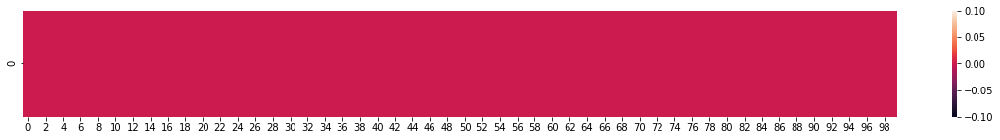

In [ ]:
# Lame AF
df_x = df[['edu', 'Val_Adventure']] 
y = df[['Edu_Imaginativeness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0, 1, 0.01)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list])
plt.figure(figsize=(20,2))
sns.heatmap(kappa_arr)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4613516732063021
            Iterations: 16
            Function evaluations: 16
            Gradient evaluations: 16

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:44   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:       

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4614027743878752
            Iterations: 28
            Function evaluations: 29
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  3
Alpha: 0.02

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:44   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 3 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4614538611436007
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  5
Alpha: 0.04

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02293
Time:                         17:34:45   Log-Likelihood:                -384.25
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 3 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46150493341321347
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  7
Alpha: 0.06

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:45   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46170907798723987
            Iterations: 22
            Function evaluations: 23
            Gradient evaluations: 22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  15
Alpha: 0.14

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02292
Time:                         17:34:46   Log-Likelihood:                -384.26
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46176007793801527
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  17
Alpha: 0.16

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:46   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46181106354550416
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  19
Alpha: 0.18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      826
Method:                            MLE   Df Model:                            1
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02292
Time:                         17:34:47   Log-Likelihood:                -384.26
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46186203466504155
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  21
Alpha: 0.2

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:47   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46191299133656744
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  23
Alpha: 0.22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:47   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4619639336201966
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  25
Alpha: 0.24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:47   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4620148614784723
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  27
Alpha: 0.26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:48   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4620657749238056
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  29
Alpha: 0.28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:48   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4621166739609074
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  31
Alpha: 0.3

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:48   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4621675585941413
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  33
Alpha: 0.32

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:49   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4622438585541122
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  36
Alpha: 0.35000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02866
Time:                         17:34:50   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4622947071992065
            Iterations: 24
            Function evaluations: 24
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  38
Alpha: 0.37

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:50   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46234554145581325
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  40
Alpha: 0.39

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:50   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46239636133709244
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  42
Alpha: 0.41000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:51   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   L

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4624471668373587
            Iterations: 23
            Function evaluations: 23
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  44
Alpha: 0.43

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:51   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4624979579937708
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  46
Alpha: 0.45

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:51   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4625487347420942
            Iterations: 22
            Function evaluations: 22
            Gradient evaluations: 22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  48
Alpha: 0.47000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:52   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46259949714006476
            Iterations: 21
            Function evaluations: 22
            Gradient evaluations: 21

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  50
Alpha: 0.49

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:52   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46265024518942577
            Iterations: 20
            Function evaluations: 21
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  52
Alpha: 0.51

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:52   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46270097889875195
            Iterations: 20
            Function evaluations: 20
            Gradient evaluations: 20

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  54
Alpha: 0.53

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:52   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4627516982482733
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  56
Alpha: 0.55

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:53   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4628024032761224
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  58
Alpha: 0.5700000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:53   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.462853093923717
            Iterations: 19
            Function evaluations: 19
            Gradient evaluations: 19

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  60
Alpha: 0.59

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:53   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4629037702711789
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  62
Alpha: 0.61

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02865
Time:                         17:34:54   Log-Likelihood:                -382.00
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4629544322846685
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  64
Alpha: 0.63

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:54   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4630050799837614
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  66
Alpha: 0.65

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:54   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4630557133581875
            Iterations: 17
            Function evaluations: 18
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  68
Alpha: 0.67

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:54   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46310633242767335
            Iterations: 18
            Function evaluations: 18
            Gradient evaluations: 18

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  70
Alpha: 0.6900000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:55   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.463156937217965
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  72
Alpha: 0.71

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:55   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46320752765311646
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  74
Alpha: 0.73

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:55   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4632581038320236
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  76
Alpha: 0.75

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:56   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46330866572673013
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  78
Alpha: 0.77

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:56   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:56   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:                 1.285e-05
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -1.5516      0.094    -16.438      0.000      -1.737      -1.367
edu                 0.3591      0.098      3.658      0.000       0.167       0.551
Val_Achievement     0.18

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46338448175160213
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  81
Alpha: 0.8

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02864
Time:                         17:34:57   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4634350079135656
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  83
Alpha: 0.8200000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:57   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4634855198039155
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  85
Alpha: 0.84

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:57   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4635360174280853
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  87
Alpha: 0.86

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:58   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46358650078805647
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  89
Alpha: 0.88

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:58   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4636369698885367
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  91
Alpha: 0.9

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:58   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46368742473459607
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  93
Alpha: 0.92

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:58   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.46373786533141637
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  95
Alpha: 0.9400000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02863
Time:                         17:34:59   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LL

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.463788291683794
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  97
Alpha: 0.96

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02862
Time:                         17:34:59   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.4638387037966556
            Iterations: 17
            Function evaluations: 17
            Gradient evaluations: 17

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  99
Alpha: 0.98

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                            Logit Regression Results                           
Dep. Variable:     Edu_Imaginativeness   No. Observations:                  828
Model:                           Logit   Df Residuals:                      825
Method:                            MLE   Df Model:                            2
Date:                 Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02862
Time:                         17:34:59   Log-Likelihood:                -382.01
converged:                        True   LL-Null:                       -393.27
Covariance Type:             nonrobust   LLR p-value:     

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

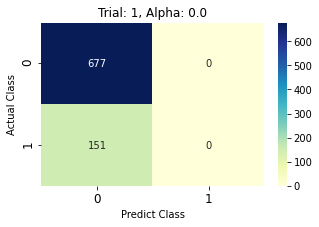

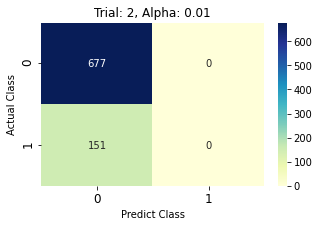

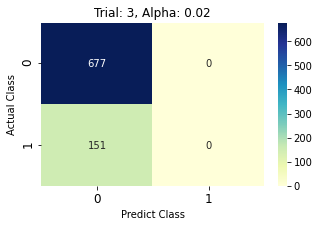

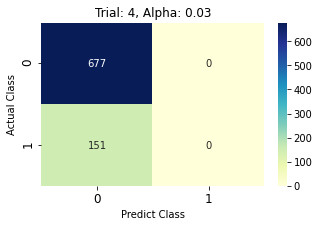

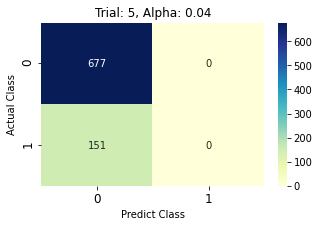

...

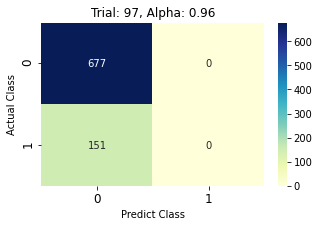

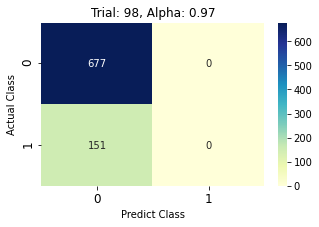

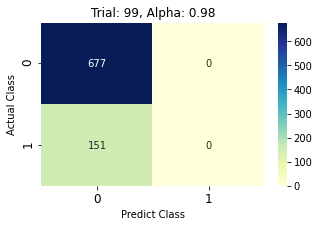

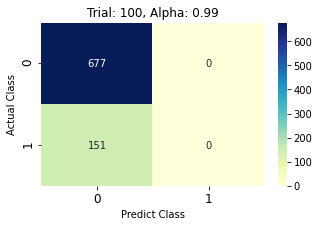

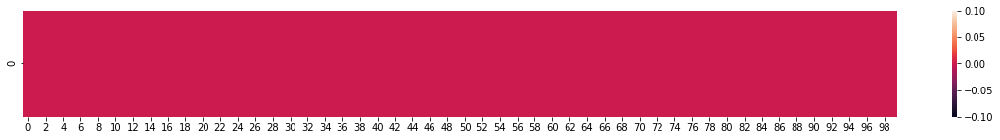

In [ ]:
# Lame AF
df_x = df[['edu', 'Val_Achievement']] 
y = df[['Edu_Imaginativeness']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0, 1, 0.01)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list])
plt.figure(figsize=(20,2))
sns.heatmap(kappa_arr)

Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6434844755879194
            Iterations: 14
            Function evaluations: 15
            Gradient evaluations: 14

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  1
Alpha: 0.0

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04087
Time:                        17:35:14   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:               

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 3 out of 4 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6435122608770686
            Iterations: 40
            Function evaluations: 40
            Gradient evaluations: 40

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  3
Alpha: 0.02

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04087
Time:                        17:35:14   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:73: ConvergenceWarning: QC check did not pass for 1 out of 4 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/l1_solvers_common.py:146: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6435678030609502
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  7
Alpha: 0.06

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      826
Method:                           MLE   Df Model:                            1
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.02701
Time:                        17:35:15   Log-Likelihood:                -540.50
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6435955598632579
            Iterations: 35
            Function evaluations: 35
            Gradient evaluations: 35

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  9
Alpha: 0.08

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      825
Method:                           MLE   Df Model:                            2
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.03068
Time:                        17:35:15   Log-Likelihood:                -538.46
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6436233071008127
            Iterations: 34
            Function evaluations: 34
            Gradient evaluations: 34

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  11
Alpha: 0.1

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04087
Time:                        17:35:16   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in greater
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:903: RuntimeWarning: invalid value encountered in less
  return (a < x) & (x < b)
/usr/local/lib/python3.6/dist-packages/scipy/stats/_distn_infrastructure.py:1912: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= _a)


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6437064917539888
            Iterations: 32
            Function evaluations: 32
            Gradient evaluations: 32

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  17
Alpha: 0.16

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04087
Time:                        17:35:16   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.643789590672518
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  23
Alpha: 0.22

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:18   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6438172712724152
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  25
Alpha: 0.24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:18   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6438449423427013
            Iterations: 29
            Function evaluations: 29
            Gradient evaluations: 29

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  27
Alpha: 0.26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:19   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6438726039178799
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  29
Alpha: 0.28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:19   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6439002559379181
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  31
Alpha: 0.3

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:19   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6439278984785962
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  33
Alpha: 0.32

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:20   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6439555315074136
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  35
Alpha: 0.34

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:20   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6439831550266654
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  37
Alpha: 0.36

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:20   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


AUC score:  0.5612353275101174
Accuracy:  0.6219806763285024
Cohen's Kappa:  0.1340764203520307
Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6440107690310951
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  39
Alpha: 0.38

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:20   Log-Likelihood:                -532.81
converged:                       True   LL-Null:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.644024572472804
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  40
Alpha: 0.39

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:21   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6440521722198761
            Iterations: 27
            Function evaluations: 28
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  42
Alpha: 0.41000000000000003

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:21   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-valu

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6440797624686488
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  44
Alpha: 0.43

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:21   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6441211300209404
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  47
Alpha: 0.46

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:22   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6441486965084597
            Iterations: 28
            Function evaluations: 28
            Gradient evaluations: 28

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  49
Alpha: 0.48

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:22   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6441762534994708
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  51
Alpha: 0.5

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:22   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6442038010036338
            Iterations: 27
            Function evaluations: 27
            Gradient evaluations: 27

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  53
Alpha: 0.52

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:23   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.644231338991184
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  55
Alpha: 0.54

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:23   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6442588675232508
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  57
Alpha: 0.56

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:23   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6442863865120051
            Iterations: 26
            Function evaluations: 26
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  59
Alpha: 0.58

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:23   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6443138960160772
            Iterations: 26
            Function evaluations: 27
            Gradient evaluations: 26

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  61
Alpha: 0.6

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:24   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6443413960422449
            Iterations: 24
            Function evaluations: 25
            Gradient evaluations: 24

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  63
Alpha: 0.62

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:24   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6443688865932391
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  65
Alpha: 0.64

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:24   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6443826283154082
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  66
Alpha: 0.65

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:25   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6444101046193016
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  68
Alpha: 0.67

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:25   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6444375714597667
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  70
Alpha: 0.6900000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:25   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6444650287913778
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  72
Alpha: 0.71

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:26   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6444924766029718
            Iterations: 23
            Function evaluations: 24
            Gradient evaluations: 23

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  74
Alpha: 0.73

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:26   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6445199149840276
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  76
Alpha: 0.75

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:26   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6445473438726053
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  78
Alpha: 0.77

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04086
Time:                        17:35:27   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.644574763284585
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  80
Alpha: 0.79

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:27   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6446021732218513
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  82
Alpha: 0.81

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:27   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6446295736840238
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  84
Alpha: 0.8300000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:27   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6446569646736919
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  86
Alpha: 0.85

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:28   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6446843461912851
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  88
Alpha: 0.87

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:28   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.64471171826041
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  90
Alpha: 0.89

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:28   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:               

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.644739080803508
            Iterations: 25
            Function evaluations: 26
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  92
Alpha: 0.91

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:29   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6447664339629331
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  94
Alpha: 0.93

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:29   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.6447937775954985
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  96
Alpha: 0.9500000000000001

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:29   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.644821111766634
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  98
Alpha: 0.97

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:30   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:              

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Optimization terminated successfully.    (Exit mode 0)
            Current function value: 0.644848436450618
            Iterations: 25
            Function evaluations: 25
            Gradient evaluations: 25

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

Trial:  100
Alpha: 0.99

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

                           Logit Regression Results                           
Dep. Variable:          Edu_Deligence   No. Observations:                  828
Model:                          Logit   Df Residuals:                      824
Method:                           MLE   Df Model:                            3
Date:                Wed, 18 Nov 2020   Pseudo R-squ.:                 0.04085
Time:                        17:35:30   Log-Likelihood:                -532.81
converged:                       True   LL-Null:                       -555.51
Covariance Type:            nonrobust   LLR p-value:             

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

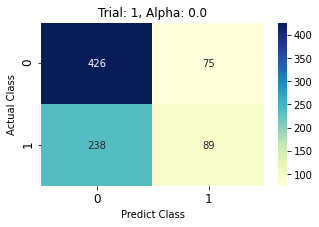

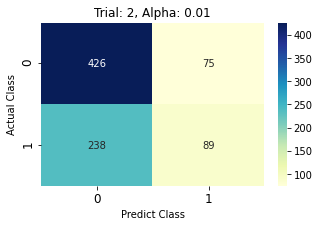

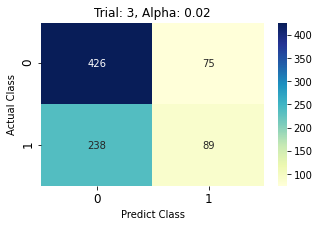

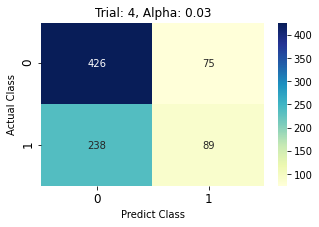

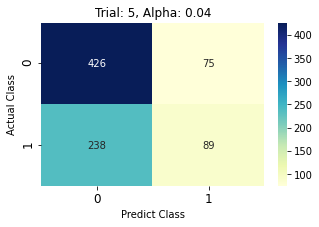

...

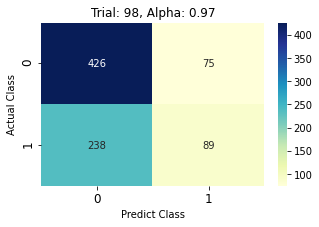

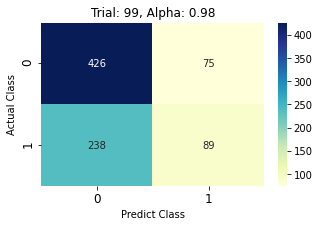

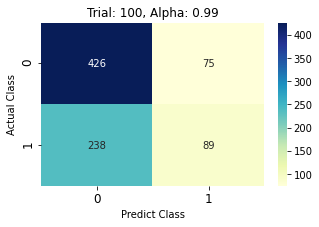

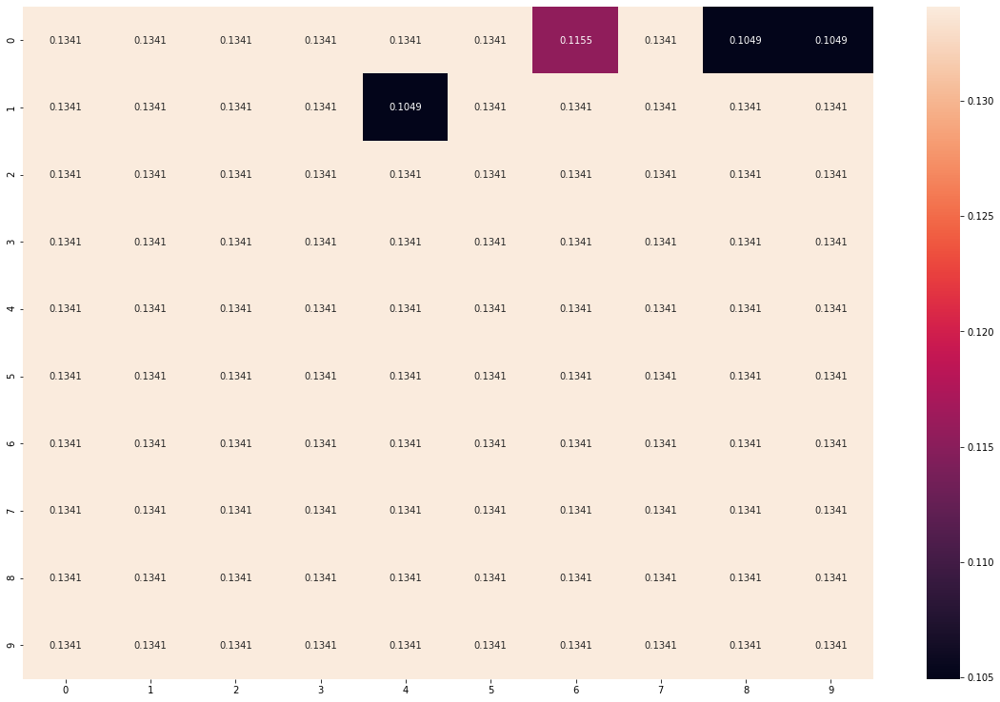

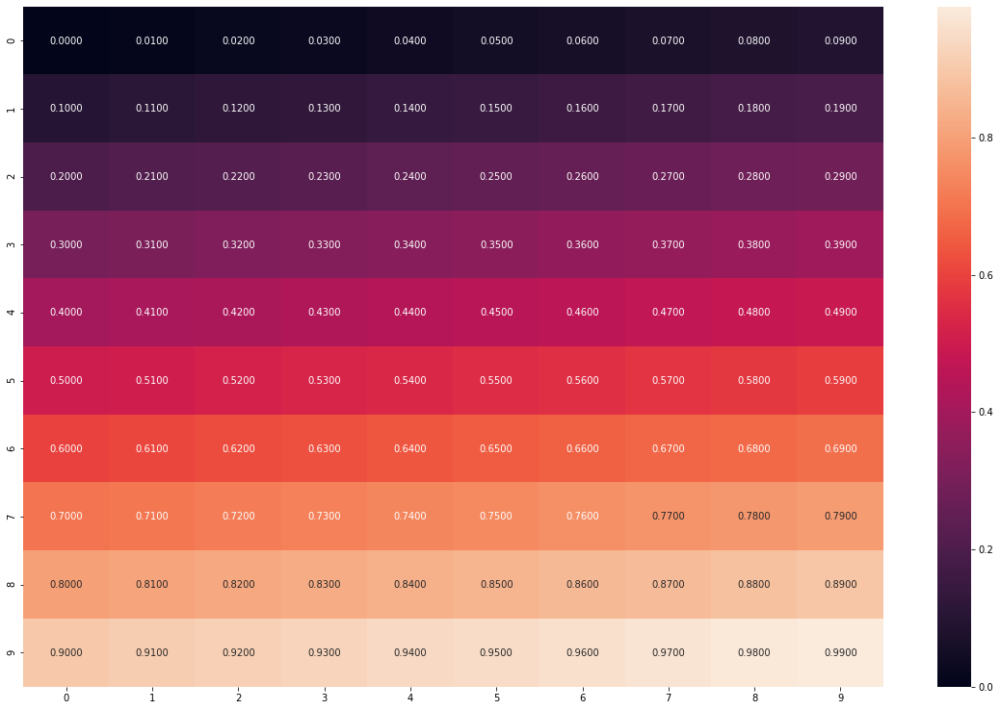

In [ ]:
# Lame AF
df_x = df[['edu','Val_Creativity', 'Val_Tradition']] 
y = df[['Edu_Deligence']]

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((828,1)),pre_x),axis = 1)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))

kappa_list = []
alphas_grid = np.arange(0, 1, 0.01)
trial = 1

for i in alphas_grid:
  
  log_reg = sm.Logit(y, x).fit_regularized(alpha = i) 
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print('Trial: ', trial)
  print('Alpha:', i)
  print('\nXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX\n')
  print(log_reg.summary())

  # Model Evaluation
  y_hat = log_reg.predict(x)
  prediction = list(map(round, y_hat))
  cm = confusion_matrix(y, prediction)
  auc = roc_auc_score(y, prediction)
  kappa = cohen_kappa_score(y, prediction)
  kappa_list.append(kappa)
  acc = accuracy_score(y, prediction)
  print('AUC score: ', auc)
  print('Accuracy: ', acc)
  print('Cohen\'s Kappa: ', kappa)

  plt.figure(figsize=(5,3))
  sns.heatmap(cm, annot=True, fmt="d", cmap="YlGnBu")
  alpha = 'Trial: '+ str(trial) + ', ' + 'Alpha: ' + str(i)
  plt.title(alpha)
  plt.xticks(size=12)
  plt.xlabel('Predict Class')
  plt.ylabel('Actual Class')
  plt.yticks(size=12)

  trial += 1

kappa_arr = np.array([kappa_list]).reshape(10,10)
plt.figure(figsize=(20,13))
sns.heatmap(kappa_arr, annot=True, fmt=".4f")

alphas_grid = alphas_grid.reshape(10,10)
plt.figure(figsize=(20,13))
sns.heatmap(alphas_grid, annot=True, fmt=".4f")

# Polynomial Regression ('bout the Conflict Btwn Sci. & Religion)

In [ ]:
!pip install -q --upgrade pyreadstat

     |████████████████████████████████| 2.0MB 7.2MB/s 


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import missingno as msno
import statsmodels.api as sm

In [ ]:
df = pd.read_spss("data.sav")

## Data Preprocessing

In [ ]:
# Polynomial Regression on the Conflict btwn Sci. & Religion 
ctrl_vb = ['sex','V238','V239','EDU','V242','V57','V55']
ind_vb = ['V153','V154','V155','V156','V192','V193','V194','V195','V196']
dpd_vb = ['V140','V143','V152','V207','V207A','V203','V203A','V204','V205','V206']

In [ ]:
df_ctrl_vb = df[ctrl_vb]
transform_dict = {"V238":"soc_class","V239":"income","EDU":"edu","V242":"age",
                  "V242":"age","V57":"marriage_status","V55":"controllability"}
df_ctrl_vb.rename(columns = transform_dict, inplace = True)

for i in df_ctrl_vb.columns:
  df_ctrl_vb[i] = df_ctrl_vb[i].cat.add_categories('Missing')
  df_ctrl_vb.fillna({i:"Missing"}, inplace = True)

df_ctrl_vb["sex"] = df_ctrl_vb["sex"].replace({'女性':'female', '男性':'male'}).astype("category")
df_ctrl_vb["soc_class"] = df_ctrl_vb["soc_class"].replace({'上層階級':1, '中上階級':2, '中下階級':3, '勞工階級':4, '下層階級':5, 'Missing':np.nan}).astype("float")
df_ctrl_vb['income'] = df_ctrl_vb['income'].replace({'最低':'1', '最高':'10', 'Missing':np.nan}).astype("float")
df_ctrl_vb["edu"] = df_ctrl_vb["edu"].replace({'國、初中':2, '大學及以上':5, '專科':4, '小學及以下':1, '高中、職':3, 'Missing':np.nan}).astype("float")
df_ctrl_vb["age"] = df_ctrl_vb["age"].replace({'Missing':np.nan}).astype("float")
df_ctrl_vb["marriage_status"] = df_ctrl_vb["marriage_status"].replace({'分居':'seperated', '同居':'cohabitation', '喪偶':'widowed', '單身（從未結過婚）':'single', '已婚':'married', '離婚':'divorced', 'Missing':np.nan}).astype("category")
df_ctrl_vb['controllability'] = df_ctrl_vb['controllability'].replace({'完全沒選擇權':'1', '有很大的選擇權':'10', 'Missing':np.nan}).astype("float")

In [ ]:
df_ind_vb = df[ind_vb]
transform_dict = {'V153':"Religion_Insistence",'V154':'Religion_Only_Acceptable',
                  'V155':'Religion_Edu_Diversity','V156':'Religion_Relativity',
                  'V192':'Sci_Convenience','V193':"Sci_Future_Generation_Dvlp",
                  'V194':'Sci_Overdependence','V195':'Sci_Distortion_Val_Jgmt',
                  'V196':'Sci_Irrelevance'}
df_ind_vb.rename(columns = transform_dict, inplace = True)

for i in df_ind_vb.columns:
  df_ind_vb[i] = df_ind_vb[i].cat.add_categories('Missing')
  df_ind_vb.fillna({i:"Missing"}, inplace = True)

df_ind_vb['Religion_Insistence'] = df_ind_vb['Religion_Insistence'].replace({'非常同意':1,'同意':2,'不同意':3,'非常不同意':4,'不知道':np.nan,'Missing':np.nan}).astype("float")
df_ind_vb['Religion_Only_Acceptable'] = df_ind_vb['Religion_Only_Acceptable'].replace({'非常同意':1,'同意':2,'不同意':3,'非常不同意':4,'不知道':np.nan,'Missing':np.nan}).astype("float")
df_ind_vb['Religion_Edu_Diversity'] = df_ind_vb['Religion_Edu_Diversity'].replace({'非常同意':1,'同意':2,'不同意':3,'非常不同意':4,'不知道':np.nan,'Missing':np.nan}).astype("float")
df_ind_vb['Religion_Relativity'] = df_ind_vb['Religion_Relativity'].replace({'非常同意':1,'同意':2,'不同意':3,'非常不同意':4,'不知道':np.nan,'Missing':np.nan}).astype("float")
df_ind_vb['Sci_Convenience'] = df_ind_vb['Sci_Convenience'].replace({'非常不同意':1,'非常同意':10,'Missing':np.nan}).astype("float")
df_ind_vb['Sci_Future_Generation_Dvlp'] = df_ind_vb['Sci_Future_Generation_Dvlp'].replace({'非常不同意':1,'非常同意':10,'Missing':np.nan}).astype("float")
df_ind_vb['Sci_Overdependence'] = df_ind_vb['Sci_Overdependence'].replace({'非常不同意':1,'非常同意':10,'Missing':np.nan}).astype("float")
df_ind_vb['Sci_Distortion_Val_Jgmt'] = df_ind_vb['Sci_Distortion_Val_Jgmt'].replace({'非常不同意':1,'非常同意':10,'Missing':np.nan}).astype("float")
df_ind_vb['Sci_Irrelevance'] = df_ind_vb['Sci_Irrelevance'].replace({'非常不同意':1,'非常同意':10,'Missing':np.nan}).astype("float")

In [ ]:
df_dpd_vb = df[dpd_vb]
transform_dict = {'V140':"Imp_Democracy",'V143':'Existentialism',
                  'V152':'Imp_God(s)','V207':'Jgmt_Suicide',
                  'V207A':'Jgmt_Euthanasia','V203':"Jgmt_Homosexuality",
                  'V203A':'Jgmt_Sex_Trade','V204':'Jgmt_Abortion',
                  'V205':'Jgmt_Divorce','V206':'Jgmt_Premarital_Sex'}
df_dpd_vb.rename(columns = transform_dict, inplace = True)

for i in df_dpd_vb.columns:
  df_dpd_vb[i] = df_dpd_vb[i].cat.add_categories('Missing')
  df_dpd_vb.fillna({i:"Missing"}, inplace = True)

df_dpd_vb['Imp_Democracy'] = df_dpd_vb['Imp_Democracy'].replace({'絕對重要':10,'一點都不重要':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Existentialism'] = df_dpd_vb['Existentialism'].replace({'從未':1,'很少':2,'有時':3,'經常':4,'Missing':np.nan}).astype("float")
df_dpd_vb['Imp_God(s)'] = df_dpd_vb['Imp_God(s)'].replace({'很重要':10,'一點都不重要':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Suicide'] = df_dpd_vb['Jgmt_Suicide'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Euthanasia'] = df_dpd_vb['Jgmt_Euthanasia'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Homosexuality'] = df_dpd_vb['Jgmt_Homosexuality'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Sex_Trade'] = df_dpd_vb['Jgmt_Sex_Trade'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Abortion'] = df_dpd_vb['Jgmt_Abortion'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Divorce'] = df_dpd_vb['Jgmt_Divorce'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")
df_dpd_vb['Jgmt_Premarital_Sex'] = df_dpd_vb['Jgmt_Premarital_Sex'].replace({'總是有理':10,'根本沒道理':1,'Missing':np.nan}).astype("float")

In [ ]:
df_poly = pd.concat([df_ctrl_vb,df_ind_vb,df_dpd_vb], axis=1)
df_poly

,sex,soc_class,income,edu,age,marriage_status,controllability,Religion_Insistence,Religion_Only_Acceptable,Religion_Edu_Diversity,Religion_Relativity,Sci_Convenience,Sci_Future_Generation_Dvlp,Sci_Overdependence,Sci_Distortion_Val_Jgmt,Sci_Irrelevance,Imp_Democracy,Existentialism,Imp_God(s),Jgmt_Suicide,Jgmt_Euthanasia,Jgmt_Homosexuality,Jgmt_Sex_Trade,Jgmt_Abortion,Jgmt_Divorce,Jgmt_Premarital_Sex
0,male,3.0,6.0,3.0,28.0,single,7.0,3.0,3.0,3.0,2.0,8.0,7.0,7.0,7.0,5.0,9.0,4.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0
1,female,4.0,5.0,3.0,34.0,married,8.0,3.0,3.0,1.0,2.0,5.0,8.0,5.0,5.0,3.0,10.0,3.0,5.0,1.0,10.0,5.0,5.0,5.0,5.0,5.0
2,female,4.0,5.0,2.0,48.0,married,8.0,3.0,3.0,3.0,2.0,6.0,4.0,NaN,5.0,5.0,10.0,3.0,5.0,1.0,3.0,1.0,1.0,1.0,2.0,1.0
3,male,3.0,4.0,3.0,59.0,married,6.0,3.0,3.0,3.0,2.0,8.0,8.0,8.0,2.0,2.0,10.0,3.0,2.0,1.0,3.0,3.0,5.0,5.0,5.0,3.0
4,male,3.0,5.0,3.0,21.0,single,5.0,3.0,3.0,3.0,2.0,10.0,10.0,10.0,7.0,3.0,6.0,3.0,5.0,1.0,1.0,6.0,1.0,6.0,6.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1233,male,4.0,3.0,2.0,68.0,married,8.0,3.0,3.0,2.0,2.0,8.0,8.0,5.0,8.0,4.0,9.0,3.0,4.0,6.0,8.0,5.0,6.0,7.0,7.0,7.0
1234,female,2.0,6.0,3.0,66.0,single,10.0,NaN,3.0,2.0,2.0,NaN,NaN,NaN,NaN,8.0,9.0,3.0,9.0,1.0,7.0,2.0,1.0,1.0,8.0,3.0
1235,female,4.0,3.0,2.0,48.0,widowed,7.0,4.0,4.0,NaN,2.0,8.0,9.0,5.0,8.0,7.0,9.0,3.0,5.0,1.0,3.0,NaN,1.0,4.0,8.0,5.0
1236,female,2.0,1.0,1.0,55.0,married,8.0,3.0,3.0,2.0,2.0,1.0,1.0,1.0,10.0,10.0,10.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0


### Missing Data Screening

In [ ]:
import missingno as msno

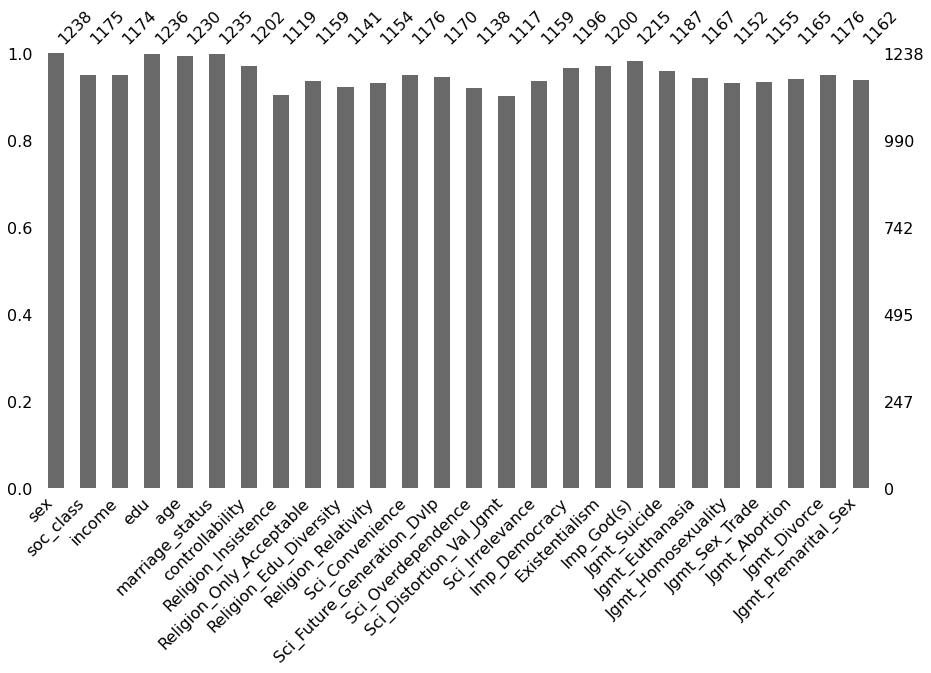

In [ ]:
msno.bar(df_poly, figsize=(15,8))

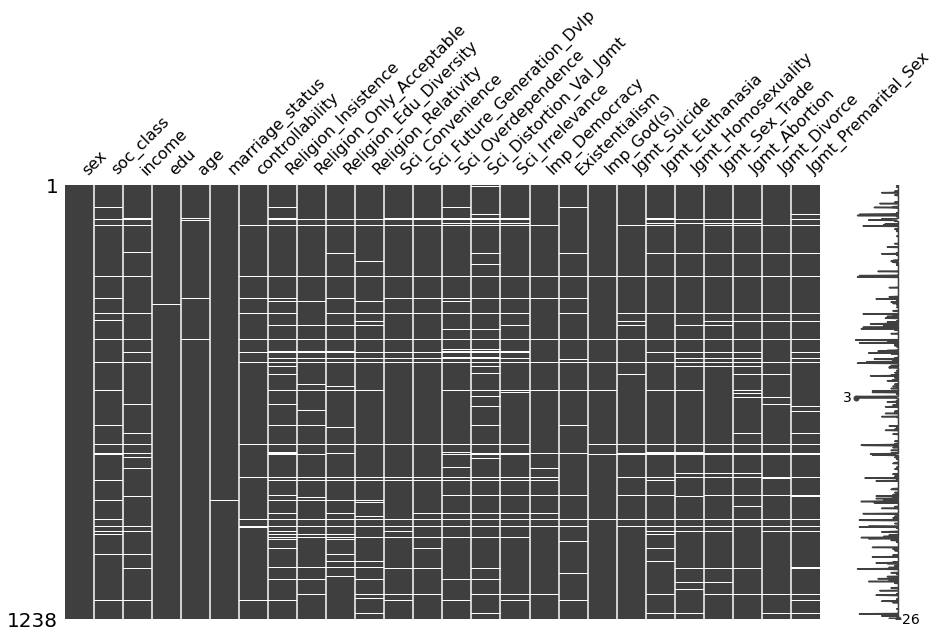

In [ ]:
msno.matrix(df_poly,figsize=(15,8))

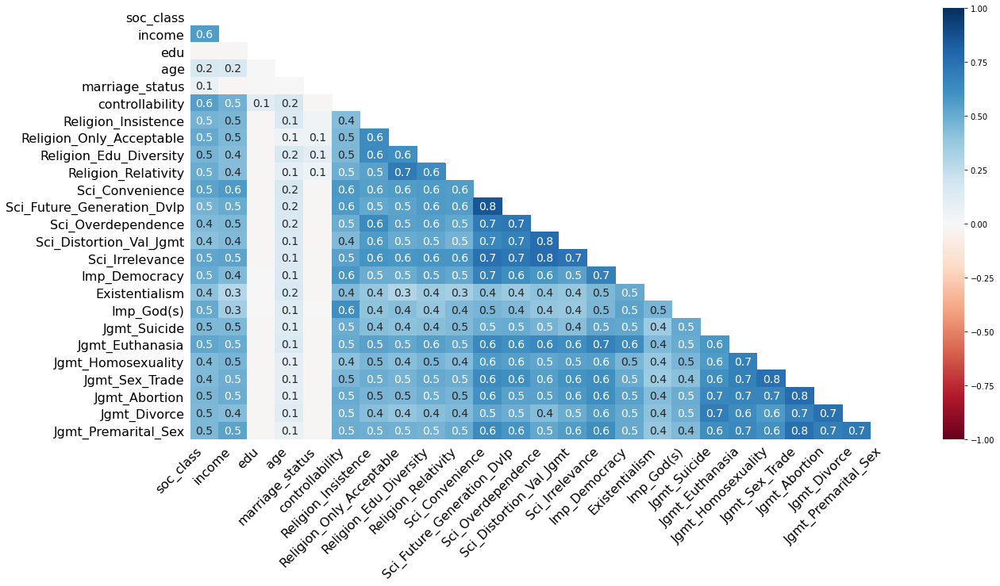

In [ ]:
msno.heatmap(df_poly,figsize=(20,10))

In [ ]:
df_poly.dropna(inplace=True)
df_poly

,sex,soc_class,income,edu,age,marriage_status,controllability,Religion_Insistence,Religion_Only_Acceptable,Religion_Edu_Diversity,Religion_Relativity,Sci_Convenience,Sci_Future_Generation_Dvlp,Sci_Overdependence,Sci_Distortion_Val_Jgmt,Sci_Irrelevance,Imp_Democracy,Existentialism,Imp_God(s),Jgmt_Suicide,Jgmt_Euthanasia,Jgmt_Homosexuality,Jgmt_Sex_Trade,Jgmt_Abortion,Jgmt_Divorce,Jgmt_Premarital_Sex
0,male,3.0,6.0,3.0,28.0,single,7.0,3.0,3.0,3.0,2.0,8.0,7.0,7.0,7.0,5.0,9.0,4.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0
1,female,4.0,5.0,3.0,34.0,married,8.0,3.0,3.0,1.0,2.0,5.0,8.0,5.0,5.0,3.0,10.0,3.0,5.0,1.0,10.0,5.0,5.0,5.0,5.0,5.0
3,male,3.0,4.0,3.0,59.0,married,6.0,3.0,3.0,3.0,2.0,8.0,8.0,8.0,2.0,2.0,10.0,3.0,2.0,1.0,3.0,3.0,5.0,5.0,5.0,3.0
4,male,3.0,5.0,3.0,21.0,single,5.0,3.0,3.0,3.0,2.0,10.0,10.0,10.0,7.0,3.0,6.0,3.0,5.0,1.0,1.0,6.0,1.0,6.0,6.0,6.0
5,female,2.0,5.0,5.0,37.0,single,8.0,3.0,3.0,3.0,2.0,8.0,8.0,8.0,6.0,6.0,9.0,3.0,6.0,1.0,5.0,8.0,5.0,6.0,6.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1231,female,3.0,3.0,4.0,38.0,married,5.0,3.0,4.0,3.0,2.0,6.0,4.0,6.0,8.0,4.0,10.0,3.0,7.0,2.0,8.0,6.0,6.0,3.0,7.0,6.0
1232,female,3.0,5.0,5.0,45.0,married,9.0,3.0,3.0,3.0,2.0,7.0,6.0,4.0,2.0,6.0,10.0,3.0,10.0,5.0,8.0,7.0,2.0,3.0,8.0,7.0
1233,male,4.0,3.0,2.0,68.0,married,8.0,3.0,3.0,2.0,2.0,8.0,8.0,5.0,8.0,4.0,9.0,3.0,4.0,6.0,8.0,5.0,6.0,7.0,7.0,7.0
1236,female,2.0,1.0,1.0,55.0,married,8.0,3.0,3.0,2.0,2.0,1.0,1.0,1.0,10.0,10.0,10.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0


### Data Profiling

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5]), <a list of 24 Text major ticklabel objects>)

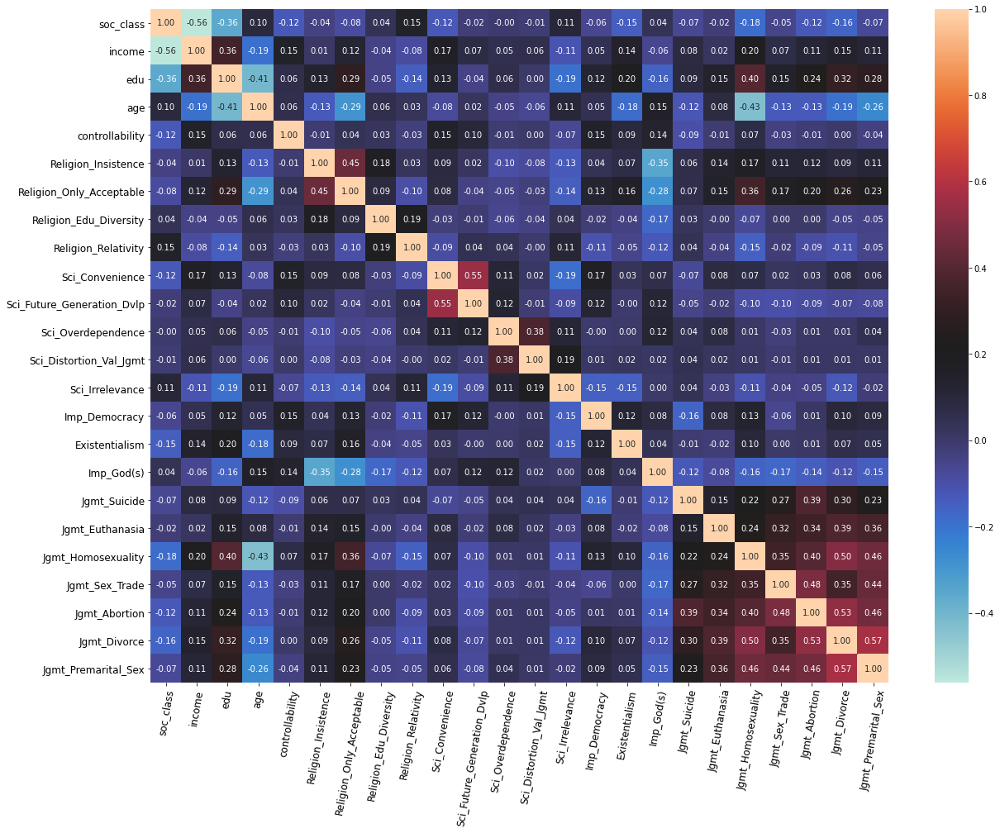

In [ ]:
plt.figure(figsize=(20,15))
c= df_poly.corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12)

(array([0.5, 1.5, 2.5, 3.5, 4.5]), <a list of 5 Text major ticklabel objects>)

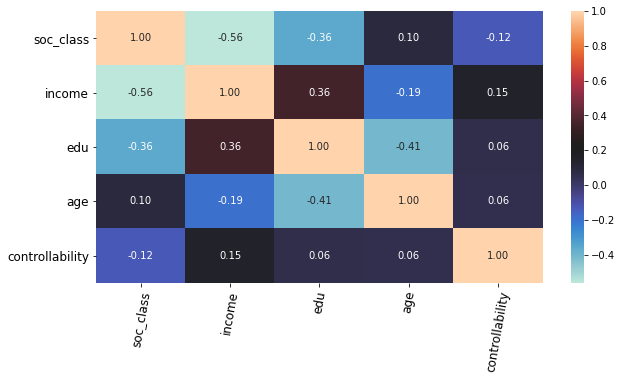

In [ ]:
# Correlation btwn the ctrl_vb
plt.figure(figsize=(10,5))
c= df_poly.loc[:,'sex':'controllability'].corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12, rotation = 0)

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5]),
 <a list of 9 Text major ticklabel objects>)

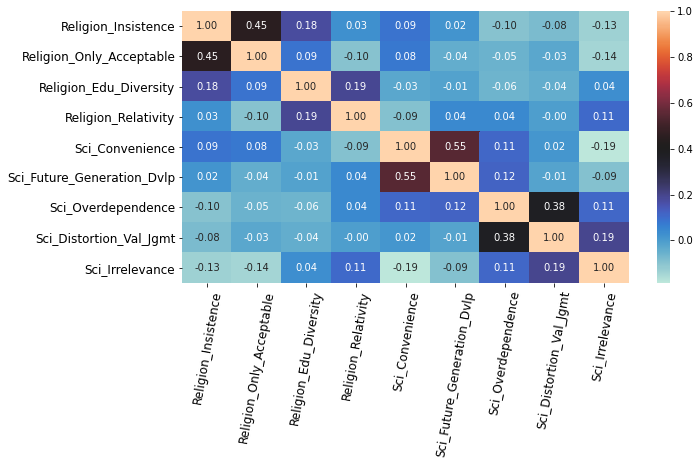

In [ ]:
plt.figure(figsize=(10,5))
c= df_poly.loc[:,'Religion_Insistence':'Sci_Irrelevance'].corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12)

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5]),
 <a list of 10 Text major ticklabel objects>)

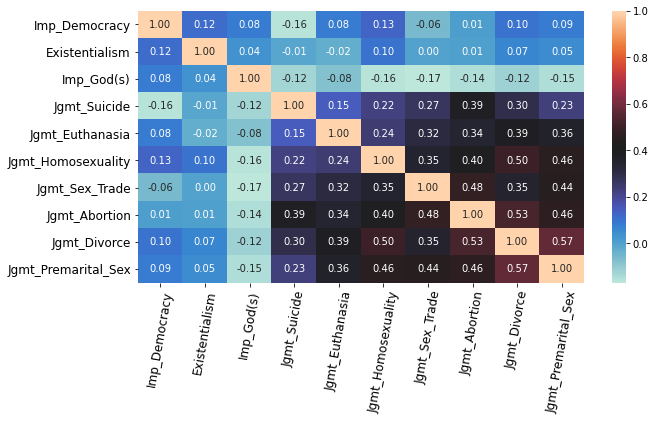

In [ ]:
plt.figure(figsize=(10,5))
c= df_poly.loc[:,'Imp_Democracy':'Jgmt_Premarital_Sex'].corr()
sns.heatmap(c, annot=True, fmt='.2f', cmap='icefire')
plt.xticks(size=12, rotation=80)
plt.yticks(size=12)

### Variable Integration

In [ ]:
# Reverse Coding
df_poly['soc_class'] = 6 - df_poly['soc_class']
df_poly['Religion_Edu_Diversity'] = 5 - df_poly['Religion_Edu_Diversity']
df_poly['Religion_Relativity'] = 5 - df_poly['Religion_Relativity']
df_poly['Sci_Overdependence'] = 11 - df_poly['Sci_Overdependence']
df_poly['Sci_Distortion_Val_Jgmt'] = 11 - df_poly['Sci_Distortion_Val_Jgmt']
df_poly['Sci_Irrelevance'] = 11 - df_poly['Sci_Irrelevance']

# Creating new variables
df_poly['Faith_Religion'] = (df_poly['Religion_Insistence'] + df_poly['Religion_Only_Acceptable'] + df_poly['Religion_Edu_Diversity'] + df_poly['Religion_Relativity'])
df_poly['Faith_Science'] = (df_poly['Sci_Convenience'] + df_poly['Sci_Future_Generation_Dvlp'] + df_poly['Sci_Overdependence'] + df_poly['Sci_Distortion_Val_Jgmt'] + df_poly['Sci_Irrelevance'])

In [ ]:
df_poly[['Faith_Religion','Faith_Science']].corr()

,Faith_Religion,Faith_Science
Faith_Religion,1.000000,0.131683
Faith_Science,0.131683,1.000000


In [ ]:
df_poly[['Faith_Religion','Faith_Science']].describe()

,Faith_Religion,Faith_Science
count,967.000000,967.000000
mean,11.482937,32.450879
std,1.371655,6.066182
min,7.000000,5.000000
25%,11.000000,29.000000
50%,11.000000,32.000000
75%,12.000000,36.000000
max,16.000000,50.000000


In [ ]:
grid = alt.Chart(df_poly).mark_bar().encode(
    alt.X('Faith_Religion:Q',bin=alt.BinParams(maxbins=10)),
    alt.Y('Faith_Science:Q',bin=alt.BinParams(maxbins=10)),
    alt.Color('count()',scale=alt.Scale(scheme='magma'))
)

density_x = alt.Chart(df_poly).transform_density(
    density='Faith_Religion',
    as_=['Faith_Religion', 'density'],
    extent = [7,16]
).mark_line(orient='vertical').encode(
    x="Faith_Religion:Q",
    y='density:Q'
).properties(
    height=100
)

density_y = alt.Chart(df_poly).transform_density(
    density='Faith_Science',
    as_=['Faith_Science', 'density'],
    extent = [5, 50]
).mark_line(orient='horizontal').encode(
    x='density:Q',
    y="Faith_Science:Q"
).properties(
    width=100
)

density_x & (grid | density_y)

alt.VConcatChart(...)

### Design Matrix with `patsy`

In [ ]:
from patsy import dmatrix

In [ ]:
formula = "(" + " + ".join(list(df_poly[['Faith_Religion','Faith_Science']].columns)) + ")" + "**2"
formula

'(Faith_Religion + Faith_Science)**2'

In [ ]:
x_poly = dmatrix(formula, data = df_poly[['Faith_Religion','Faith_Science']], return_type = "dataframe")

In [ ]:
x_poly['Faith_Religion**2'] = x_poly['Faith_Religion'] ** 2
x_poly['Faith_Science**2'] = x_poly['Faith_Science'] ** 2

### Check point

In [ ]:
df_poly = pd.concat([x_poly,df_dpd_vb],axis=1)
df_poly.dropna(inplace=True)

In [ ]:
df_poly.to_csv("df_poly.csv")

## Polynomial Regression

In [ ]:
import statsmodels.api as sm
import pandas as pd
import numpy as np
df = pd.read_csv('df_poly.csv',index_col=0)

In [ ]:
df

,sex,soc_class,edu,Faith_Religion,Faith_Science,Faith_Religion:Faith_Science,Imp_Democracy,Existentialism,Imp_God(s),Jgmt_Suicide,Jgmt_Euthanasia,Jgmt_Homosexuality,Jgmt_Sex_Trade,Jgmt_Abortion,Jgmt_Divorce,Jgmt_Premarital_Sex
0,male,3.0,3.0,0.6875,0.58,0.39875,9.0,4.0,5.0,2.0,5.0,5.0,5.0,5.0,2.0,2.0
1,female,4.0,3.0,0.8125,0.66,0.53625,10.0,3.0,5.0,1.0,10.0,5.0,5.0,5.0,5.0,5.0
3,male,3.0,3.0,0.6875,0.74,0.50875,10.0,3.0,2.0,1.0,3.0,3.0,5.0,5.0,5.0,3.0
4,male,3.0,3.0,0.6875,0.66,0.45375,6.0,3.0,5.0,1.0,1.0,6.0,1.0,6.0,6.0,6.0
5,female,2.0,5.0,0.6875,0.58,0.39875,9.0,3.0,6.0,1.0,5.0,8.0,5.0,6.0,6.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1231,female,3.0,4.0,0.7500,0.50,0.37500,10.0,3.0,7.0,2.0,8.0,6.0,6.0,3.0,7.0,6.0
1232,female,3.0,5.0,0.6875,0.68,0.46750,10.0,3.0,10.0,5.0,8.0,7.0,2.0,3.0,8.0,7.0
1233,male,4.0,2.0,0.7500,0.64,0.48000,9.0,3.0,4.0,6.0,8.0,5.0,6.0,7.0,7.0,7.0
1236,female,2.0,1.0,0.7500,0.28,0.21000,10.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0,5.0


### Statistical Inference

                            OLS Regression Results                            
Dep. Variable:         Existentialism   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     6.110
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           1.40e-05
Time:                        03:29:08   Log-Likelihood:                -1357.0
No. Observations:                 967   AIC:                             2726.
Df Residuals:                     961   BIC:                             2755.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

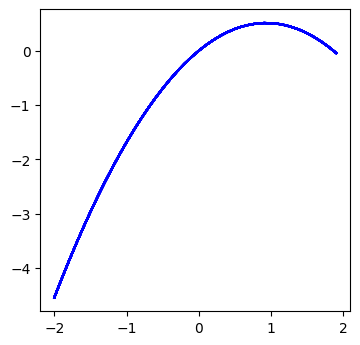

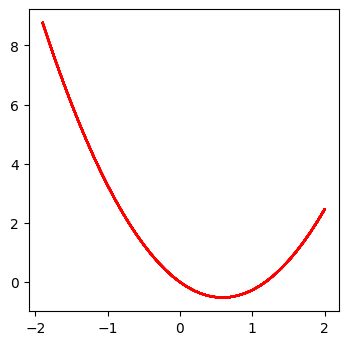

In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

bootnum = 10000
X = ['Faith_Religion', 'Faith_Science','Faith_Religion**2','Faith_Religion:Faith_Science','Faith_Science**2']
Y = ['Existentialism']

df_x = df[X] 
df_y = df[Y] 

scaler = StandardScaler()
pre_x = scaler.fit_transform(df_x)
x = np.concatenate((np.ones((967,1)),pre_x),axis = 1)
y = scaler.fit_transform(df_y)
x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))
y = pd.DataFrame(data=y,columns=list(df_y.columns))
poly_reg = sm.OLS(y, x).fit()

print(poly_reg.summary())

# Here's the block for Bootstrapping
boot_samples = []
for i in range(bootnum):
  df_to_be_boot = df[X + Y]
  boot_df = df_to_be_boot.sample(n = 967, replace = True)

  df_x = boot_df[X]
  df_y = boot_df[Y] 

  scaler = StandardScaler()
  pre_x = scaler.fit_transform(df_x)
  x = np.concatenate((np.ones((967,1)),pre_x),axis = 1)
  y = scaler.fit_transform(df_y)
  x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))
  y = pd.DataFrame(data=y,columns=list(df_y.columns))
  poly_reg = sm.OLS(y, x).fit() 

  # Along the Line of Congruency
  a1 = poly_reg.params[1] + poly_reg.params[2]
  a2 = poly_reg.params[3] + poly_reg.params[4] + poly_reg.params[5]

  # Along the Line of Incongruency
  a3 = poly_reg.params[1] - poly_reg.params[2]
  a4 = poly_reg.params[3] - poly_reg.params[4] + poly_reg.params[5]
  a = [a1,a2,a3,a4]
  boot_samples.append(a)
  arr_boot_samples = np.array(boot_samples)
  arr_boot_samples = arr_boot_samples.T
  a_CI = []
  for j in range(4):
    lower_boundary = np.quantile(arr_boot_samples[j], 0.05) # Probably should go to 0.025
    upper_boundary = np.quantile(arr_boot_samples[j], 0.95) # Probably should go to 0.975
    confidence_interval = [lower_boundary,upper_boundary]
    a_CI.append(confidence_interval)
a_CI = np.array(a_CI)
a_CI = pd.DataFrame(a_CI, index = ['a1','a2','a3','a4'],columns=['lower_boundary', 'upper_boundary'])

print(a_CI)

# Block of Viz
import plotly.graph_objects as go

x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)


fig = go.Figure(data=[go.Surface(z=z,x=x,y=y,colorscale='YlGnBu')])

fig.update_layout(title='Surface Plot', 
                  scene_aspectmode='cube', 
                  autosize=False,
                  scene = dict(
                    xaxis_title='Faith_Religion',
                    yaxis_title='Faith_Science',
                    zaxis_title='Existentialism'),
                  width=800, height=800,
                  margin=dict(l=50, r=50, b=50, t=50))

fig.show()

# Projection along the LOC
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
x = y
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
fig = plt.figure(figsize = (4, 4), dpi = 100)
plt.plot(x, z, "b")

# Projection along the LOIC
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
x = -y
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
fig = plt.figure(figsize = (4, 4), dpi = 100)
plt.plot(x, z, "r")

                            OLS Regression Results                            
Dep. Variable:           Jgmt_Suicide   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.374
Date:                Mon, 16 Nov 2020   Prob (F-statistic):             0.0374
Time:                        03:58:23   Log-Likelihood:                -1366.2
No. Observations:                 967   AIC:                             2744.
Df Residuals:                     961   BIC:                             2774.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

                            OLS Regression Results                            
Dep. Variable:        Jgmt_Euthanasia   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     4.755
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           0.000268
Time:                        04:00:32   Log-Likelihood:                -1360.3
No. Observations:                 967   AIC:                             2733.
Df Residuals:                     961   BIC:                             2762.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

                            OLS Regression Results                            
Dep. Variable:     Jgmt_Homosexuality   R-squared:                       0.118
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     25.59
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           2.68e-24
Time:                        04:02:41   Log-Likelihood:                -1311.7
No. Observations:                 967   AIC:                             2635.
Df Residuals:                     961   BIC:                             2665.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

                            OLS Regression Results                            
Dep. Variable:         Jgmt_Sex_Trade   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     4.361
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           0.000625
Time:                        04:04:49   Log-Likelihood:                -1361.3
No. Observations:                 967   AIC:                             2735.
Df Residuals:                     961   BIC:                             2764.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

                            OLS Regression Results                            
Dep. Variable:          Jgmt_Abortion   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                     7.386
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           8.29e-07
Time:                        04:07:02   Log-Likelihood:                -1353.9
No. Observations:                 967   AIC:                             2720.
Df Residuals:                     961   BIC:                             2749.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

                            OLS Regression Results                            
Dep. Variable:           Jgmt_Divorce   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.053
Method:                 Least Squares   F-statistic:                     11.83
Date:                Mon, 16 Nov 2020   Prob (F-statistic):           4.04e-11
Time:                        04:09:18   Log-Likelihood:                -1343.2
No. Observations:                 967   AIC:                             2698.
Df Residuals:                     961   BIC:                             2728.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

                             OLS Regression Results                            
Dep. Variable:     Jgmt_Premarital_Sex   R-squared:                       0.047
Model:                             OLS   Adj. R-squared:                  0.042
Method:                  Least Squares   F-statistic:                     9.445
Date:                 Mon, 16 Nov 2020   Prob (F-statistic):           8.38e-09
Time:                         04:11:31   Log-Likelihood:                -1348.9
No. Observations:                  967   AIC:                             2710.
Df Residuals:                      961   BIC:                             2739.
Df Model:                            5                                         
Covariance Type:             nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Interc

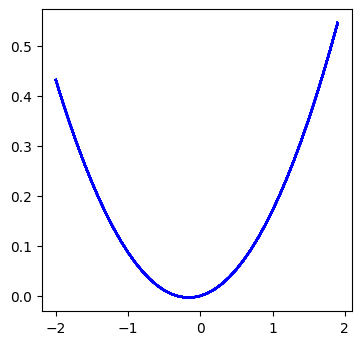

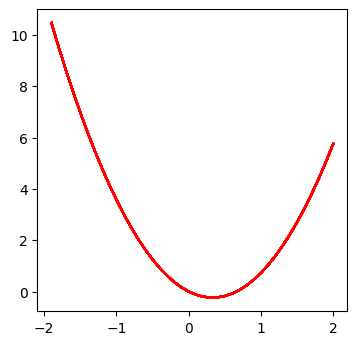

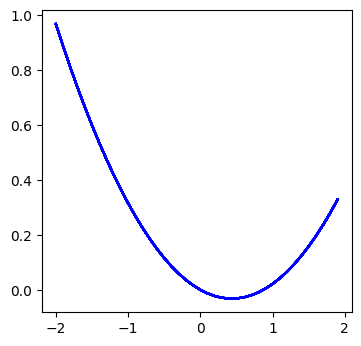

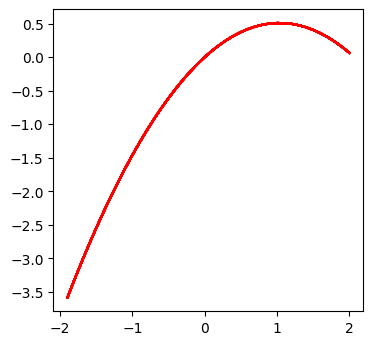

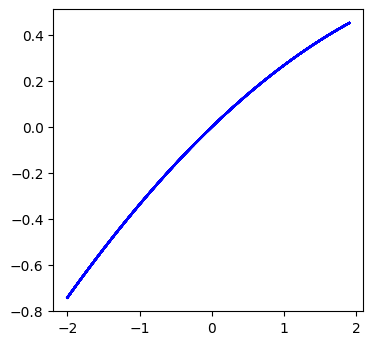

...

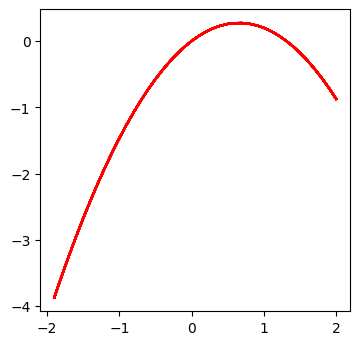

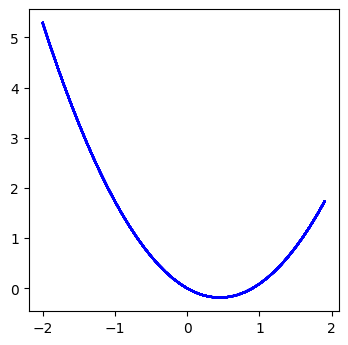

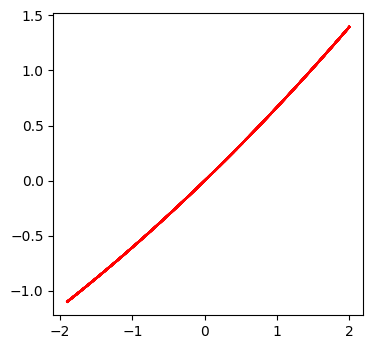

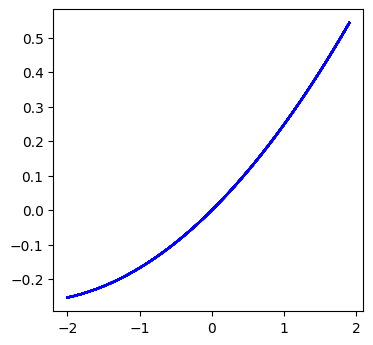

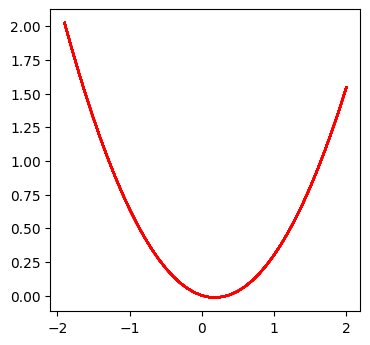

In [ ]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt 
import plotly.graph_objects as go
import pandas as pd
import numpy as np

bootnum = 10000
X = ['Faith_Religion', 'Faith_Science','Faith_Religion**2','Faith_Religion:Faith_Science','Faith_Science**2']
for i in ['Jgmt_Suicide','Jgmt_Euthanasia', 'Jgmt_Homosexuality', 'Jgmt_Sex_Trade','Jgmt_Abortion', 'Jgmt_Divorce', 'Jgmt_Premarital_Sex']:
  Y = [i]

  df_x = df[X] 
  df_y = df[Y] 

  scaler = StandardScaler()
  pre_x = scaler.fit_transform(df_x)
  x = np.concatenate((np.ones((967,1)),pre_x),axis = 1)
  y = scaler.fit_transform(df_y)
  x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))
  y = pd.DataFrame(data=y,columns=list(df_y.columns))
  poly_reg = sm.OLS(y, x).fit()

  print(poly_reg.summary())

  # Here's the block for Bootstrapping
  boot_samples = []
  for i in range(bootnum):
    df_to_be_boot = df[X + Y]
    boot_df = df_to_be_boot.sample(n = 967, replace = True)

    df_x = boot_df[X]
    df_y = boot_df[Y] 

    scaler = StandardScaler()
    pre_x = scaler.fit_transform(df_x)
    x = np.concatenate((np.ones((967,1)),pre_x),axis = 1)
    y = scaler.fit_transform(df_y)
    x = pd.DataFrame(data=x,columns=['Intercept'] + list(df_x.columns))
    y = pd.DataFrame(data=y,columns=list(df_y.columns))
    poly_reg = sm.OLS(y, x).fit() 

    # Along the Line of Congruency
    a1 = poly_reg.params[1] + poly_reg.params[2]
    a2 = poly_reg.params[3] + poly_reg.params[4] + poly_reg.params[5]

    # Along the Line of Incongruency
    a3 = poly_reg.params[1] - poly_reg.params[2]
    a4 = poly_reg.params[3] - poly_reg.params[4] + poly_reg.params[5]
    a = [a1,a2,a3,a4]
    boot_samples.append(a)
    arr_boot_samples = np.array(boot_samples)
    arr_boot_samples = arr_boot_samples.T
    a_CI = []
    for j in range(4):
      lower_boundary = np.quantile(arr_boot_samples[j], 0.05) # Probably should go to 0.025
      upper_boundary = np.quantile(arr_boot_samples[j], 0.95) # Probably should go to 0.975
      confidence_interval = [lower_boundary,upper_boundary]
      a_CI.append(confidence_interval)
  a_CI = np.array(a_CI)
  a_CI = pd.DataFrame(a_CI, index = ['a1','a2','a3','a4'],columns=['lower_boundary', 'upper_boundary'])

  print(a_CI)

  # Block of Viz
  x = np.arange(-2, 2, 0.1)
  y = np.arange(-2, 2, 0.1)
  x, y = np.meshgrid(x, y)
  z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)

  fig = go.Figure(data=[go.Surface(z=z,x=x,y=y,colorscale='YlGnBu')])
  fig.update_layout(title='Surface Plot', 
                    scene_aspectmode='cube', 
                    autosize=False,
                    scene = dict(
                      xaxis_title='Faith_Religion',
                      yaxis_title='Faith_Science',
                      zaxis_title= df_y.columns[0]),
                    width=800, height=800,
                    margin=dict(l=50, r=50, b=50, t=50))

  fig.show()

  # Projection along the LOC
  x = np.arange(-2, 2, 0.1)
  y = np.arange(-2, 2, 0.1)
  x, y = np.meshgrid(x, y)
  x = y
  z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
  fig = plt.figure(figsize = (4, 4), dpi = 100)
  plt.plot(x, z, "b")

  # Projection along the LOIC
  x = np.arange(-2, 2, 0.1)
  y = np.arange(-2, 2, 0.1)
  x, y = np.meshgrid(x, y)
  x = -y
  z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
  fig = plt.figure(figsize = (4, 4), dpi = 100)
  plt.plot(x, z, "r")

### Visualization

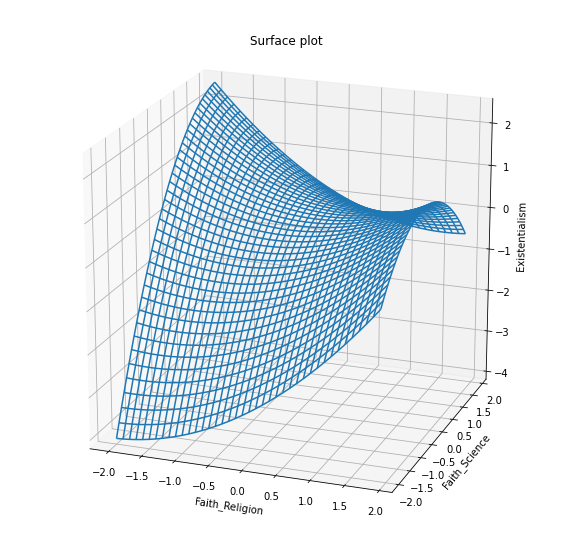

In [ ]:
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
fig = plt.figure(figsize=(10,10)) 
ax = fig.gca(projection ='3d') 
ax.plot_wireframe(x, y, z, cmap = 'viridis') 
ax.set_title('Surface plot') 
ax.set_xlabel('Faith_Religion')
ax.set_ylabel('Faith_Science')
ax.set_zlabel('Existentialism')
ax.view_init(20, -70) 
plt.show()

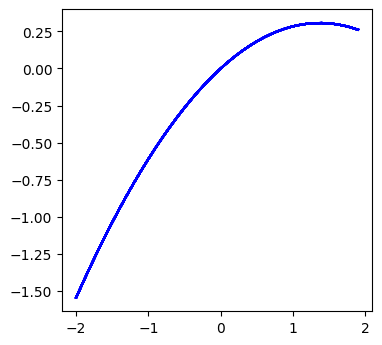

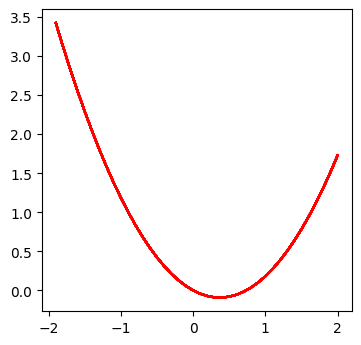

In [ ]:
# Block of Viz
import plotly.graph_objects as go

x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)

fig = go.Figure(data=[go.Surface(z=z,x=x,y=y,colorscale='YlGnBu')])
fig.update_layout(title='Surface Plot', 
                  scene_aspectmode='cube', 
                  autosize=False,
                  scene = dict(
                    xaxis_title='Faith_Religion',
                    yaxis_title='Faith_Science',
                    zaxis_title='Existentialism'),
                  width=800, height=800,
                  margin=dict(l=50, r=50, b=50, t=50))

fig.show()

import matplotlib.pyplot as plt 
# Projection along the LOC
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
x = y
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
fig = plt.figure(figsize = (4, 4), dpi = 100)
plt.plot(x, z, "b")

# Projection along the LOIC
x = np.arange(-2, 2, 0.1)
y = np.arange(-2, 2, 0.1)
x, y = np.meshgrid(x, y)
x = -y
z = poly_reg.params[0] + poly_reg.params[1]*x + poly_reg.params[2]*y + poly_reg.params[3]*(x**2) + poly_reg.params[4]*(x*y) + poly_reg.params[5]*(y**2)
fig = plt.figure(figsize = (4, 4), dpi = 100)
plt.plot(x, z, "r")

# Sentiment Analysis (Religious & Philosophical Text)



## Text Preprocess

In [ ]:
import pandas as pd
df = pd.read_csv('ISIS Religious Texts v1.csv', encoding = "ISO-8859-1")

In [ ]:
df = df[['Type','Quote']]
df['Type'] = df['Type'].astype('category')
df['Type'].cat.categories

Index(['Bible', 'Christian', 'Classical Islamic Scholar', 'Classical Scholar',
       'Contemporary Scholar', 'Fatwa', 'Fiqh', 'Hadith', 'Hadith ',
       'Hadith Commentary', 'Islamist', 'Jihadist',
       'Media, Politician, or Analyst', 'Muslim Historical Figure', 'Poetry',
       'Qur'an', 'Religious Scholar', 'Salaf', 'Shia Scholar', 'Sira',
       'Tafsir', 'Unknown', 'Western Historical Figure'],
      dtype='object')

In [ ]:
df['Quote'] = df['Quote'].astype(str)

### `lower()` and `re`

In [ ]:
import re

REPLACE_NO_SPACE = re.compile("[.;:!\'?,\"()\[\]]")
REPLACE_WITH_SPACE = re.compile("(<br\s*/><br\s*/>)|(\-)|(\/)")

def preprocess(text):
    text = [REPLACE_NO_SPACE.sub("", line.lower()) for line in text]
    text = [REPLACE_WITH_SPACE.sub(" ", line) for line in text]
    
    return text

In [ ]:
df['text_processed'] = preprocess(df['Quote'])

### Removing Stopwords

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords

english_stop_words = stopwords.words('english')

def remove_stop_words(corpus):
    removed_stop_words = []
    for text in corpus:
        removed_stop_words.append(
            ' '.join([word for word in text.split() 
                      if word not in english_stop_words])
        )
    return removed_stop_words

df['text_processed'] = remove_stop_words(df['text_processed'])

### Lemmatization

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
def get_lemmatized_text(corpus):
    from nltk.stem import WordNetLemmatizer
    lemmatizer = WordNetLemmatizer()
    return [' '.join([lemmatizer.lemmatize(word) for word in text.split()]) for text in corpus]

df['text_processed'] = get_lemmatized_text(df['text_processed'])

In [ ]:
df_jihad = df[df['Type'] == 'Jihadist']
df_jihad

,Type,Quote,text_processed
0,Jihadist,"The spark has been lit here in Iraq, and its h...",spark lit iraq heat continue intensify  allah...
2,Jihadist,"The spark has been lit here in Iraq, and its ...",the spark lit iraq heat continue intensify  ...
3,Jihadist,"O Muslims everywhere, glad tidings to you and...",o muslim everywhere glad tidings expect good ...
4,Jihadist,"O Ummah of Islam, indeed the world today has ...",o ummah islam indeed world today divided two ...
5,Jihadist,"Therefore, rush O Muslims to your state. Yes,...",therefore rush muslim state yes state rush sy...
...,...,...,...
2325,Jihadist,"""O muwahhidin, rejoice, for by Allah, we will ...",muwahhidin rejoice allah rest jihad except ben...
2412,Jihadist,"O muwahhidin, rejoice, for by Allah, we will n...",muwahhidin rejoice allah rest jihad except ben...
2477,Jihadist,"O muwahhidin, rejoice, for by Allah, we will n...",muwahhidin rejoice allah rest jihad except ben...
2578,Jihadist,"The spark has been lit here in Iraq, and its ...",the spark lit iraq heat continue intensify  ...


## Sampling from NRC Dictionary

In [4]:
import pandas as pd
df = pd.read_csv('NRC_trust.csv', index_col = 0)
df

,word
19,abacus
89,abbot
499,absolution
619,abundance
689,academic
...,...
140899,wot
141449,yearning
141679,zeal
141699,zealous


In [13]:
df_trust = df.sample(10,replace=False)
print(df_trust.to_numpy())

[['elucidate']
 ['unity']
 ['fain']
 ['connoisseur']
 ['convince']
 ['morals']
 ['secrecy']
 ['institute']
 ['chaplain']
 ['substantiate']]


## Sentiment Analysis (with `NRClex`)

In [ ]:
!pip install nrclex

     |████████████████████████████████| 399kB 5.6MB/s 
  Created wheel for nrclex: filename=NRCLex-3.0.0-cp36-none-any.whl size=43313 sha256=15f1b42b9e8a806422afb963b71eada43f5ccf8d1ceabf9145ff7678c5158cc3
  Stored in directory: /root/.cache/pip/wheels/17/31/64/035a8d245b4c217aeb8e8a2702d05dc91544b9c2334db72414
Successfully built nrclex


### Word Cloud Visualization

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
from nrclex import NRCLex

# Constructing a DataFrame with all the words with respective affects within the corpus

sentiment_dict_keys_list = []
for i in range(5):
  sentiment = NRCLex(df['text_processed'][i])
  for j in list(sentiment.affect_dict.keys()):
    if j not in sentiment_dict_keys_list:
      sentiment_dict_keys_list.append(j)
len(sentiment_dict_keys_list)

3426

In [ ]:
import pandas as pd
filepath = "NRC-Emotion-Lexicon-Wordlevel-v0.92.txt"
emolex_df = pd.read_csv(filepath,  names=["word", "emotion", "association"], skiprows=1, sep='\t')
emolex_words = emolex_df.pivot(index='word', columns='emotion', values='association').reset_index()

In [ ]:
emolex_words

emotion,word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
0,NaN,0,0,0,0,0,0,0,0,0,0
1,aback,0,0,0,0,0,0,0,0,0,0
2,abacus,0,0,0,0,0,0,0,0,0,1
3,abandon,0,0,0,1,0,1,0,1,0,0
4,abandoned,1,0,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
14177,zone,0,0,0,0,0,0,0,0,0,0
14178,zoo,0,0,0,0,0,0,0,0,0,0
14179,zoological,0,0,0,0,0,0,0,0,0,0
14180,zoology,0,0,0,0,0,0,0,0,0,0


In [ ]:
import numpy as np
corpus_sentiment_arr = np.array([[0,0,0,0,0,0,0,0,0,0,0]])
for i in sentiment_dict_keys_list:
  arr_emo = emolex_words[emolex_words.word == i].to_numpy()
  corpus_sentiment_arr = np.concatenate((corpus_sentiment_arr, arr_emo), axis=0)
corpus_sentiment_df = pd.DataFrame(corpus_sentiment_arr, columns = emolex_words.columns)
corpus_sentiment_df.drop(index = 0, inplace = True)
corpus_sentiment_df

emotion,word,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
1,restriction,1,0,0,1,0,1,0,1,0,0
2,copy,0,0,0,0,0,1,0,0,0,0
3,included,0,0,0,0,0,0,1,0,0,0
4,title,0,0,0,0,0,0,1,0,0,1
5,author,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
3422,capture,0,0,0,0,0,1,0,0,0,0
3423,toleration,0,0,0,0,0,0,1,0,0,0
3424,complement,0,1,0,0,1,0,1,0,1,1
3425,cube,0,0,0,0,0,0,0,0,0,1


In [ ]:
# Subset
df_trust = corpus_sentiment_df[corpus_sentiment_df['anticipation']==1]
df_trust.set_index('word',inplace=True)

In [ ]:
df_trust

emotion,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust
word,,,,,,,,,,
start,0,1,0,0,0,0,0,0,0,0
present,0,1,0,0,1,0,1,0,1,1
mail,0,1,0,0,0,0,0,0,0,0
young,0,1,0,0,1,0,1,0,1,0
death,1,1,1,1,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...
pry,1,1,0,0,0,1,0,0,0,1
hurried,0,1,0,0,0,1,0,0,0,0
uneasiness,0,1,0,0,0,1,0,1,0,0


In [ ]:
df_trust.index

Index(['start', 'present', 'mail', 'young', 'death', 'passion', 'priesthood',
       'betrothed', 'engaged', 'delight',
       ...
       'mediate', 'dismay', 'maternal', 'amour', 'expose', 'pry', 'hurried',
       'uneasiness', 'cash', 'complement'],
      dtype='object', name='word', length=539)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
tf_mat = vectorizer.fit_transform(df['text_processed'])

In [ ]:
df_tf = pd.DataFrame(tf_mat.toarray(),columns= vectorizer.get_feature_names())
df_tf.index = df.index 
df_tf

,0txt,0zip,10,100,1000,10000,100000000,1001,1002,1003,1004,1005,101,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,102,1020,1021,10210,10211,10212,10213,10214,10215,10216,10217,10218,10219,1022,10220,10221,10222,...,zophar,zophim,zorah,zoram,zoramite,zoramites,zorathites,zoreah,zorites,zorobabel,zuar,zuerst,zukunft,zuph,zur,zuriel,zurishaddai,zuzims,zwischen,án,âjñāta,ân,êtres,ññ,ājñāta,ālāra,ānanda,ārāda,ātman,ćsop,ćth,ćthiopia,ćthiopic,ćthiops,śakra,śakyamuni,śrāmana,śuddhodana,śākya,śāla
Meditations,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_Book_of_Mormon,0,0,237,0,0,0,0,0,0,0,0,0,8,8,8,8,8,8,8,8,8,8,8,8,6,6,0,0,0,0,0,0,0,0,0,0,6,0,0,0,...,0,0,0,12,2,33,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_Gospel_of_Buddha,1,1,78,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,2,1,1,127,2,14,0,0,0,0,0,1,1,1,1,1,1
The_King_James_Bible,0,0,2,0,0,0,0,1,1,1,1,1,36,35,36,35,34,34,33,32,32,32,28,36,26,25,1,1,1,1,1,1,1,1,1,1,23,1,1,1,...,4,1,8,0,0,0,1,1,1,3,5,0,0,3,5,1,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_Quran,0,0,75,14,2,1,1,1,0,0,0,0,12,0,0,0,0,0,0,0,0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,2,0,0,0,0,0,0,0,1,2,1,3,1,0,0,0,0,0,0


In [ ]:
df_affect_of_interest = df_tf.loc[:,df_trust.index] # Term Frequency Matrix with respect to a certain affect
df_affect_of_interest

word,start,present,mail,young,death,passion,priesthood,betrothed,engaged,delight,hunting,time,excitement,white,eagerness,marriage,succeed,long,haste,rising,powerful,money,continue,victory,celebrated,unexpected,immediately,peace,peril,opportunity,grant,gift,journey,triumph,success,good,child,successful,attempt,plan,...,suspense,commemorate,preservative,completion,radiance,bridal,entertainment,probability,impatient,towering,cradle,depraved,plight,rekindle,foreboding,uplift,owing,magical,scare,romance,stealthy,accelerate,compensate,lessen,commemoration,independence,clue,hopeful,incite,apprehensive,mediate,dismay,maternal,amour,expose,pry,hurried,uneasiness,cash,complement
Meditations,3,78,2,12,88,18,1,1,2,11,3,155,1,4,1,2,7,71,5,2,7,6,23,3,3,2,7,6,2,9,11,10,4,1,3,216,34,3,3,2,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_Book_of_Mormon,4,11,1,36,222,2,8,0,0,12,0,456,0,27,0,1,1,81,7,6,14,17,20,12,0,0,18,118,0,6,45,47,28,0,16,231,383,0,14,55,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_Gospel_of_Buddha,5,30,1,35,106,47,3,1,2,17,2,117,2,4,0,6,2,69,2,6,15,6,18,3,0,0,0,56,0,7,15,34,5,2,6,176,42,5,4,2,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_King_James_Bible,3,116,3,300,376,3,16,9,1,57,2,768,0,75,0,22,1,213,55,39,3,143,38,12,0,0,55,429,10,7,22,112,69,10,1,762,2007,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
The_Quran,2,78,5,3,90,9,0,0,6,18,0,165,2,18,0,11,10,37,9,3,19,13,3,24,1,0,4,58,0,4,9,45,39,0,16,261,125,2,6,5,...,3,5,1,2,1,4,1,2,2,1,4,2,3,1,1,3,1,1,1,1,1,1,2,1,1,1,1,1,1,1,2,1,1,1,2,1,1,1,1,1


In [ ]:
# Making a Dictionary-like Term Frequency of each Book
dict_tf = df_affect_of_interest.to_dict('records')

In [ ]:
dict_tf[0]

{'abundance': 0,
 'accelerate': 0,
 'acquiring': 0,
 'adore': 0,
 'advance': 0,
 'adventure': 0,
 'alive': 2,
 'allure': 0,
 'ambition': 2,
 'amour': 0,
 'angel': 0,
 'announcement': 0,
 'anticipation': 1,
 'antidote': 2,
 'anxiety': 4,
 'anxious': 1,
 'appeal': 1,
 'apprehensive': 0,
 'approaching': 0,
 'ardent': 0,
 'arouse': 0,
 'arrival': 0,
 'arrive': 0,
 'art': 123,
 'aspiration': 1,
 'aspire': 1,
 'aspiring': 0,
 'astrologer': 1,
 'astronomer': 2,
 'atone': 0,
 'attainable': 0,
 'attempt': 3,
 'attendance': 2,
 'audience': 1,
 'auspicious': 0,
 'await': 0,
 'balm': 0,
 'banquet': 3,
 'begun': 7,
 'betrothed': 1,
 'beware': 0,
 'birth': 3,
 'birthday': 0,
 'bless': 1,
 'blessing': 1,
 'bloom': 0,
 'board': 2,
 'boisterous': 0,
 'bountiful': 4,
 'bounty': 1,
 'bridal': 0,
 'bride': 0,
 'bridegroom': 0,
 'brilliant': 0,
 'brotherly': 0,
 'bruise': 0,
 'bye': 2,
 'cap': 1,
 'captivate': 0,
 'career': 0,
 'cash': 0,
 'cataract': 0,
 'caution': 1,
 'cautious': 1,
 'celebrated': 3,
 'c

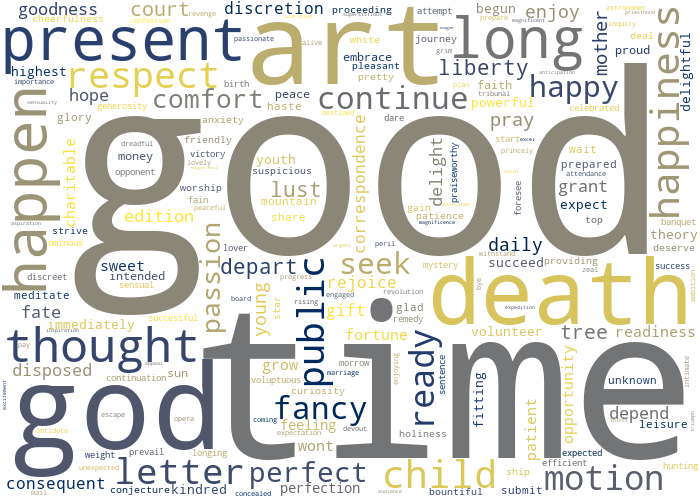

In [ ]:
from wordcloud import WordCloud
# Meditations
wordcloud = WordCloud(background_color='white',width=700,height=500,colormap='cividis').fit_words(dict_tf[0])
wordcloud.to_image()

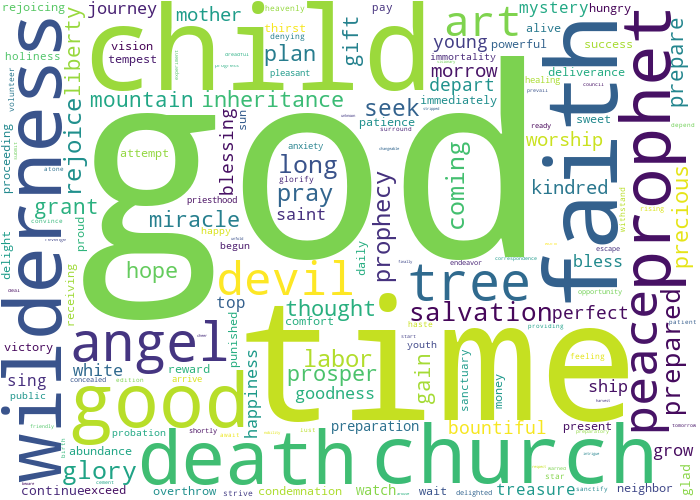

In [ ]:
# Mormon
wordcloud = WordCloud(background_color='white',width=700,height=500).fit_words(dict_tf[1])
wordcloud.to_image()

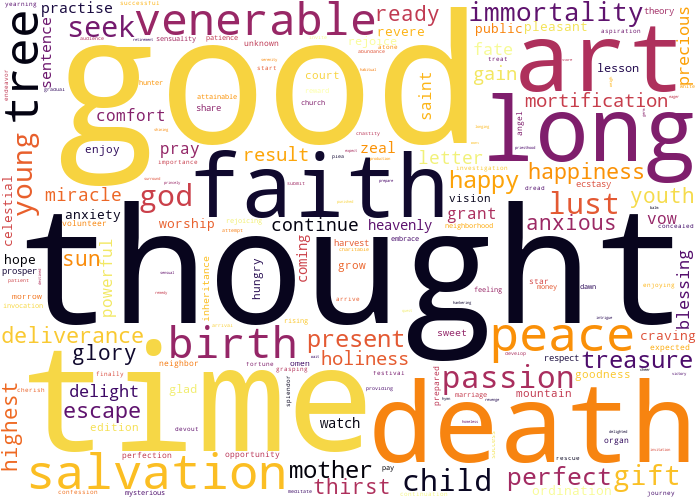

In [ ]:
# Buddha
wordcloud = WordCloud(background_color='white',width=700,height=500,colormap='inferno').fit_words(dict_tf[2])
wordcloud.to_image()

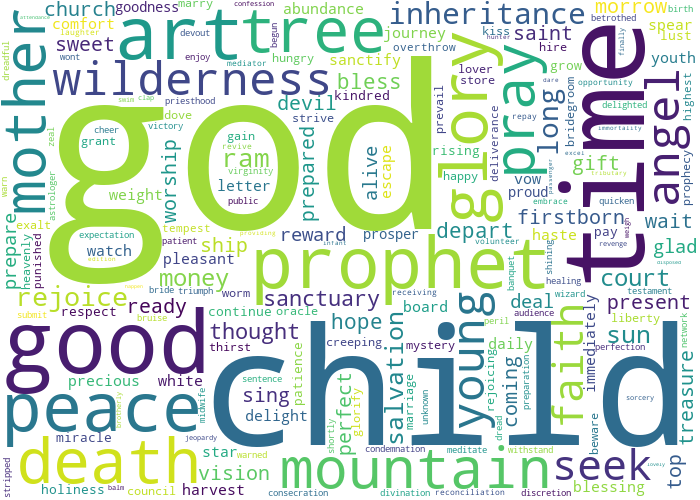

In [ ]:
# KJV Bible
wordcloud = WordCloud(background_color='white',width=700,height=500).fit_words(dict_tf[3])
wordcloud.to_image()

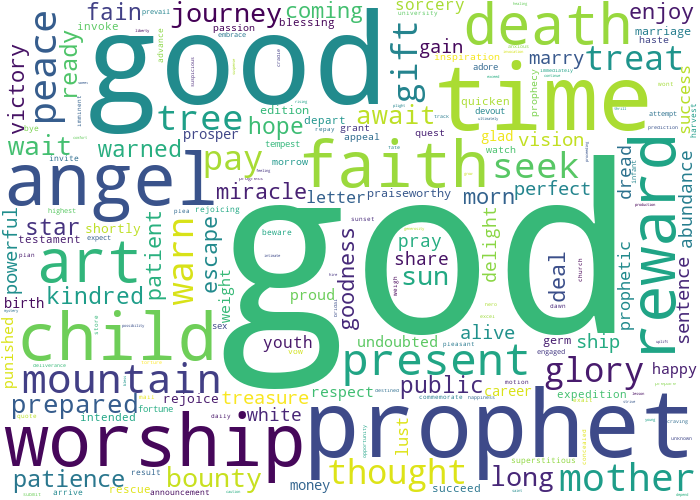

In [ ]:
# Quran
wordcloud = WordCloud(background_color='white',width=700,height=500).fit_words(dict_tf[4])
wordcloud.to_image()

### Overall Sentiment

In [ ]:
from nrclex import NRCLex
import nltk
nltk.download('punkt')

In [ ]:
df = df_jihad

In [ ]:
df.shape[0]

138

In [ ]:
df['text_processed'][0]

'spark lit iraq heat continue intensify \x96 allah\x92s permission \x96 burn crusader army dabiq'

In [ ]:
text_object = NRCLex(df['text_processed'][0])
df_f = pd.DataFrame.from_records([text_object.affect_frequencies])
df_f

,fear,anger,anticip,trust,surprise,positive,negative,sadness,disgust,joy,anticipation
0,0.0,0.0,0.0,0.25,0.0,0.5,0.0,0.0,0.0,0.0,0.25


In [ ]:
df_f_prev = None
for i in range(df.shape[0]):
  text_object = NRCLex(df['text_processed'][i])
  df_f = pd.DataFrame.from_records([text_object.affect_frequencies])
  df_f_prev = pd.concat([df_f_prev,df_f],axis=0,ignore_index=True)
df_f_prev.drop(columns=['anticip'],inplace=True)
df_f_prev.index = df.index
df_f_prev

KeyError: ignored

In [ ]:
df = pd.concat([df,df_f_prev],axis=1)

In [ ]:
df

,text,text_processed,fear,anger,trust,surprise,positive,negative,sadness,disgust,joy,anticipation
Meditations,"﻿The Project Gutenberg EBook of Meditations, b...",﻿the project gutenberg ebook meditation marcus...,0.082302,0.057365,0.139766,0.048642,0.223202,0.129861,0.068651,0.042186,0.096397,0.111626
The_Book_of_Mormon,﻿The Project Gutenberg EBook of The Book Of Mo...,﻿the project gutenberg ebook book mormon anony...,0.093801,0.054266,0.164405,0.030806,0.228470,0.127061,0.056022,0.060866,0.088360,0.095943
The_Gospel_of_Buddha,﻿The Project Gutenberg EBook of The Gospel of ...,﻿the project gutenberg ebook gospel buddha pau...,0.076105,0.048837,0.163210,0.038635,0.245902,0.117222,0.065198,0.048347,0.103404,0.093140
The_King_James_Bible,﻿The Project Gutenberg EBook of The King James...,﻿the project gutenberg ebook king james bible ...,0.083947,0.049151,0.170478,0.030979,0.226979,0.137333,0.050590,0.072358,0.087326,0.090859
The_Quran,﻿The Project Gutenberg Etext of The Koran as t...,﻿the project gutenberg etext koran translated ...,0.118032,0.053903,0.174501,0.027066,0.211095,0.116554,0.046175,0.048984,0.100965,0.102725


In [ ]:
df.to_csv("Religious_Text_with_SentimentF.csv")

### Visualization

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt 
df = pd.read_csv('Religious_Text_with_SentimentF.csv')

In [ ]:
df.columns

Index(['Unnamed: 0', 'fear', 'anger', 'trust', 'surprise', 'positive',
       'negative', 'sadness', 'disgust', 'joy', 'anticipation'],
      dtype='object')

In [ ]:
df.drop(columns=['text','text_processed'],inplace=True)
df.columns  = ['book', 'fear', 'anger', 'trust', 'surprise', 'positive',
       'negative', 'sadness', 'disgust', 'joy', 'anticipation']

In [ ]:
df.drop(columns=['positive','negative'],inplace=True)

In [ ]:
df_pic = df.melt(id_vars = ['book'])
df_pic

,book,variable,value
0,Meditations,fear,0.082302
1,The_Book_of_Mormon,fear,0.093801
2,The_Gospel_of_Buddha,fear,0.076105
3,The_King_James_Bible,fear,0.083947
4,The_Quran,fear,0.118032
5,Meditations,anger,0.057365
6,The_Book_of_Mormon,anger,0.054266
7,The_Gospel_of_Buddha,anger,0.048837
8,The_King_James_Bible,anger,0.049151
9,The_Quran,anger,0.053903


In [ ]:
alt.Chart(df_pic).mark_bar().encode(
    alt.X('value:Q',title='Affect Frequency',scale=alt.Scale(domain=[0, 1])),
    alt.Y('variable:N',title='Affect'),
    alt.Color('book:N',scale=alt.Scale(scheme='cividis'))
    ).properties(width=700, height=250, title = "Religious Text"
    ).configure_title(fontSize=20,
                      font='Courier',
                      anchor='start',
                      color='grey'
                     )

alt.Chart(...)